### Import Packages

In [1]:
# Import packages
import pandas as pd
import geopandas as gpd
import numpy as np
import matplotlib.pyplot as plt
import datetime
from shapely.geometry import Point
from shapely.geometry import shape
import seaborn as sns
from datetime import datetime
import os
from zipfile import ZipFile
import random
import networkx as nx
from datetime import datetime, timedelta
from mpl_toolkits.axes_grid1 import make_axes_locatable

### Read file and data preprocess

#### Read scooter data in JAX: Bird

In [2]:
# read scooter data in JAX
JAX_scooter_data = pd.read_csv('Data/Jacksonville/Jacksonville_scooter_data.csv')
JAX_scooter_data = JAX_scooter_data.dropna()
JAX_scooter_data = JAX_scooter_data.drop(columns = {'Operator', 'Vehicle Type', 'Trip ID'}, axis = 1)
JAX_scooter_data['Start_coordinate'] = JAX_scooter_data[['Start Longitude', 'Start Latitude']].values.tolist()
JAX_scooter_data['Start_coordinate'] = JAX_scooter_data['Start_coordinate'].apply(Point)
JAX_scooter_data['End_coordinate'] = JAX_scooter_data[['End Longitude', 'End Latitude']].values.tolist()
JAX_scooter_data['End_coordinate'] = JAX_scooter_data['End_coordinate'].apply(Point)
JAX_scooter_data.head()

,Trip Duration in Seconds,Trip Distance in Miles,Start Date,Start Time,End Date,End Time,Start Latitude,Start Longitude,End Latitude,End Longitude,Scooter ID,Start_coordinate,End_coordinate
0,90,0.08,2/24/2023,10:49:29 PM,2/24/2023,10:50:59 PM,30.325830,-81.662183,30.326482,-81.661037,11957292,POINT (-81.662183 30.32583),POINT (-81.661037 30.326482)
1,102,0.03,2/24/2023,11:30:00 PM,2/24/2023,11:31:42 PM,30.326556,-81.661137,30.326442,-81.660603,11957292,POINT (-81.661137 30.326556),POINT (-81.660603 30.326442)
2,2019,1.28,2/25/2023,8:27:17 PM,2/25/2023,9:00:56 PM,30.326189,-81.660929,30.326903,-81.656539,11957027,POINT (-81.660929 30.326189),POINT (-81.656539 30.326903)
3,1998,1.88,2/25/2023,8:27:34 PM,2/25/2023,9:00:52 PM,30.326189,-81.660980,30.326947,-81.656535,11957456,POINT (-81.66098 30.326189),POINT (-81.656535 30.326947)
4,1872,1.67,2/25/2023,9:34:07 PM,2/25/2023,10:05:19 PM,30.325250,-81.654376,30.324934,-81.654465,11961224,POINT (-81.654376 30.32525),POINT (-81.654465 30.324934)


#### How many trips

In [3]:
# how many trips
len(JAX_scooter_data)

26900

#### How many scooters

In [4]:
# how many scooters
len(JAX_scooter_data['Scooter ID'].unique())

524

#### Compute geometric distance and compare it with given distance

In [5]:
start_geo = gpd.GeoDataFrame({'geometry': JAX_scooter_data['Start_coordinate']}, crs='EPSG:4326').to_crs('EPSG:5234')
end_geo = gpd.GeoDataFrame({'geometry': JAX_scooter_data['End_coordinate']}, crs='EPSG:4326').to_crs('EPSG:5234')
JAX_scooter_data['Geometric Distance in Miles'] = start_geo.distance(end_geo) * 0.00062137
JAX_scooter_data.head()

,Trip Duration in Seconds,Trip Distance in Miles,Start Date,Start Time,End Date,End Time,Start Latitude,Start Longitude,End Latitude,End Longitude,Scooter ID,Start_coordinate,End_coordinate,Geometric Distance in Miles
0,90,0.08,2/24/2023,10:49:29 PM,2/24/2023,10:50:59 PM,30.325830,-81.662183,30.326482,-81.661037,11957292,POINT (-81.662183 30.32583),POINT (-81.661037 30.326482),0.084813
1,102,0.03,2/24/2023,11:30:00 PM,2/24/2023,11:31:42 PM,30.326556,-81.661137,30.326442,-81.660603,11957292,POINT (-81.661137 30.326556),POINT (-81.660603 30.326442),0.034033
2,2019,1.28,2/25/2023,8:27:17 PM,2/25/2023,9:00:56 PM,30.326189,-81.660929,30.326903,-81.656539,11957027,POINT (-81.660929 30.326189),POINT (-81.656539 30.326903),0.276415
3,1998,1.88,2/25/2023,8:27:34 PM,2/25/2023,9:00:52 PM,30.326189,-81.660980,30.326947,-81.656535,11957456,POINT (-81.66098 30.326189),POINT (-81.656535 30.326947),0.280350
4,1872,1.67,2/25/2023,9:34:07 PM,2/25/2023,10:05:19 PM,30.325250,-81.654376,30.324934,-81.654465,11961224,POINT (-81.654376 30.32525),POINT (-81.654465 30.324934),0.023207


D:\Software\Anaconda\Install\envs\gpd_env\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


Text(0, 0.5, 'Probability density')

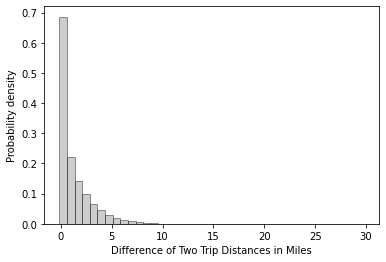

In [6]:
trip_dist_diff = np.array(JAX_scooter_data['Trip Distance in Miles'] - JAX_scooter_data['Geometric Distance in Miles'])
sns.distplot(a=trip_dist_diff, kde = False, bins=40, norm_hist = True, color='grey',
             hist_kws={"edgecolor": 'black'})
plt.xlabel('Difference of Two Trip Distances in Miles')
plt.ylabel('Probability density')

#### Trip duration and distance distribution

In [7]:
JAX_scooter_data[["Trip Duration in Seconds", "Trip Distance in Miles", "Geometric Distance in Miles"]].describe()

,Trip Duration in Seconds,Trip Distance in Miles,Geometric Distance in Miles
count,26900.000000,26900.000000,26900.000000
mean,1383.790297,1.598472,0.345328
std,1209.711656,1.584308,0.390952
min,0.000000,0.000000,0.000000
25%,469.000000,0.510000,0.010088
50%,1007.000000,1.100000,0.204754
75%,1943.250000,2.160000,0.561445
max,6002.000000,30.000000,3.910959


D:\Software\Anaconda\Install\envs\gpd_env\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


Text(0, 0.5, 'Probability density')

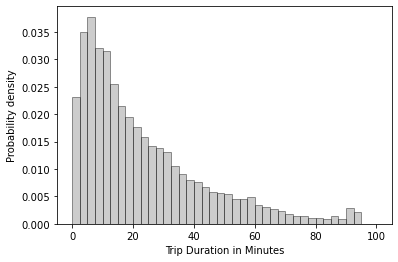

In [8]:
## travel time distribution
sns.distplot(a=JAX_scooter_data['Trip Duration in Seconds']/60, kde = False, bins=40, norm_hist = True, color='grey',
             hist_kws={"edgecolor": 'black'})
plt.xlabel('Trip Duration in Minutes')
plt.ylabel('Probability density')

Text(0, 0.5, 'Probability density')

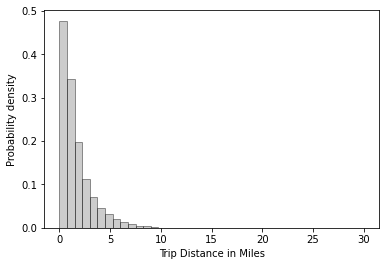

In [9]:
## travel distance distribution
sns.distplot(a=JAX_scooter_data['Trip Distance in Miles'], kde = False, bins=40, norm_hist = True, color='grey',
             hist_kws={"edgecolor": 'black'})
plt.xlabel('Trip Distance in Miles')
plt.ylabel('Probability density')

Text(0, 0.5, 'Probability density')

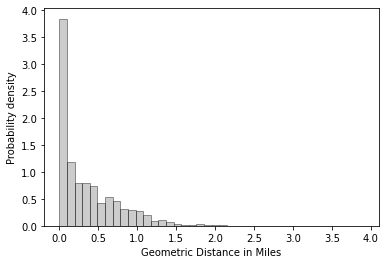

In [10]:
## geometric distance distribution
sns.distplot(a=JAX_scooter_data['Geometric Distance in Miles'], kde = False, bins=40, norm_hist = True, color='grey',
             hist_kws={"edgecolor": 'black'})
plt.xlabel('Geometric Distance in Miles')
plt.ylabel('Probability density')

#### Add temporal attributes for trips

In [11]:
# add day of a week and hour of a day
# The first recorded data happened in 2023-02-24 (Friday)
JAX_scooter_data['Start Date'] = pd.to_datetime(JAX_scooter_data['Start Date'])
JAX_scooter_data['Start_month'] = JAX_scooter_data['Start Date'].dt.month
JAX_scooter_data['Start_day'] = JAX_scooter_data['Start Date'].dt.day

JAX_scooter_data['Start_day_of_Week'] = JAX_scooter_data['Start Date'].dt.day
for i in range (len(JAX_scooter_data)):
    time_delay = (JAX_scooter_data['Start Date'].loc[i] - JAX_scooter_data['Start Date'].loc[0]).days + 5
    JAX_scooter_data.at[i, 'Start_day_of_Week'] = time_delay - int(time_delay/7)*7
JAX_scooter_data['Start_hour'] = pd.to_datetime(JAX_scooter_data['Start Time']).dt.hour
JAX_scooter_data.head()

,Trip Duration in Seconds,Trip Distance in Miles,Start Date,Start Time,End Date,End Time,Start Latitude,Start Longitude,End Latitude,End Longitude,Scooter ID,Start_coordinate,End_coordinate,Geometric Distance in Miles,Start_month,Start_day,Start_day_of_Week,Start_hour
0,90,0.08,2023-02-24,10:49:29 PM,2/24/2023,10:50:59 PM,30.325830,-81.662183,30.326482,-81.661037,11957292,POINT (-81.662183 30.32583),POINT (-81.661037 30.326482),0.084813,2,24,5,22
1,102,0.03,2023-02-24,11:30:00 PM,2/24/2023,11:31:42 PM,30.326556,-81.661137,30.326442,-81.660603,11957292,POINT (-81.661137 30.326556),POINT (-81.660603 30.326442),0.034033,2,24,5,23
2,2019,1.28,2023-02-25,8:27:17 PM,2/25/2023,9:00:56 PM,30.326189,-81.660929,30.326903,-81.656539,11957027,POINT (-81.660929 30.326189),POINT (-81.656539 30.326903),0.276415,2,25,6,20
3,1998,1.88,2023-02-25,8:27:34 PM,2/25/2023,9:00:52 PM,30.326189,-81.660980,30.326947,-81.656535,11957456,POINT (-81.66098 30.326189),POINT (-81.656535 30.326947),0.280350,2,25,6,20
4,1872,1.67,2023-02-25,9:34:07 PM,2/25/2023,10:05:19 PM,30.325250,-81.654376,30.324934,-81.654465,11961224,POINT (-81.654376 30.32525),POINT (-81.654465 30.324934),0.023207,2,25,6,21


### Temporal Distribution

#### Weekly variations

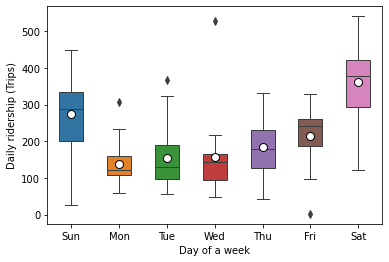

In [12]:
#JAX_start_day_ridership
JAX_week_day_time = JAX_scooter_data.groupby(['Start_month', 'Start_day'])['Start_day_of_Week'].mean().reset_index()
JAX_week_day_ridership = pd.DataFrame(JAX_scooter_data[['Start_month', 'Start_day']].value_counts()).reset_index()
JAX_week_day_ridership = JAX_week_day_ridership.rename(columns = {0: 'Daily Ridership'})
JAX_week_day_ridership = JAX_week_day_time.merge(JAX_week_day_ridership, how = 'left', on = ['Start_month', 'Start_day'])

# Week distribution

# draw boxplot
sns.boxplot(x = 'Start_day_of_Week', y = 'Daily Ridership', data = JAX_week_day_ridership,
            linewidth = 1, 
            saturation=0.75, 
            width=0.5,
            showfliers = True,
            showmeans = True, 
            meanprops={"marker":"o",
                       "markerfacecolor":"white", 
                       "markeredgecolor":"black",
                      "markersize":"8"})
plt.xlabel('Day of a week')
plt.ylabel('Daily ridership (Trips)')
plt.xticks([0.0, 1.0, 2.0, 3.0, 4.0, 5.0, 6.0], ['Sun', 'Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat'])
plt.show()

#### Hourly variations

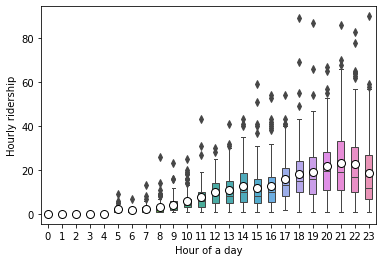

In [13]:
# JAX_start_hour_ridership
JAX_day_hour_ridership = pd.DataFrame(JAX_scooter_data[['Start_month', 'Start_day', 'Start_hour']].value_counts()).reset_index()
JAX_day_hour_ridership = JAX_day_hour_ridership.rename(columns = {0: 'Hourly Ridership'})

# add five rows to display 0-4 hour because within this time range, no scooter can be ridden, just for displaying
new_row = pd.DataFrame({'Start_month': [5,5,5,5,5],
                        'Start_day': [23,23,23,23,23],
                        'Start_hour': [0,1,2,3,4],
                        'Hourly Ridership': [0,0,0,0,0]})


# Append the new row to the DataFrame
JAX_day_hour_ridership = pd.concat([JAX_day_hour_ridership, new_row]).reset_index(drop=True)

# Hourly distribution

# draw boxplot displaying outliers
sns.boxplot(x = 'Start_hour', y = 'Hourly Ridership', data = JAX_day_hour_ridership,
            linewidth = 1, 
            saturation=0.75, 
            width=0.5,
            showfliers = True,
            showmeans = True, 
            meanprops={"marker":"o",
                       "markerfacecolor":"white", 
                       "markeredgecolor":"black",
                      "markersize":"8"})
plt.xlabel('Hour of a day')
plt.ylabel('Hourly ridership')
plt.show()

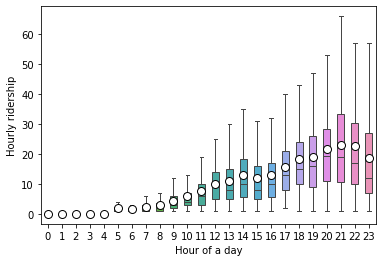

In [14]:
# draw boxplot without displaying outliers
sns.boxplot(x = 'Start_hour', y = 'Hourly Ridership', data = JAX_day_hour_ridership,
            linewidth = 1, 
            saturation=0.75, 
            width=0.5,
            showfliers = False,
            showmeans = True, 
            meanprops={"marker":"o",
                       "markerfacecolor":"white", 
                       "markeredgecolor":"black",
                      "markersize":"8"})
plt.xlabel('Hour of a day')
plt.ylabel('Hourly ridership')
plt.show()

### Input Spatial Information

#### Census block information

In [15]:
# input census block information (geometry), we need geometry information that we can add into csv files
fl_cenblkgrp = gpd.read_file('Data/Florida/cenblkgrp_2020/cenblkgrp_2020_may23.shp')
fl_JAX_cenblkgrp = fl_cenblkgrp.loc[fl_cenblkgrp['COUNTY'] == 31]
fl_JAX_cenblkgrp['geometry'] = fl_JAX_cenblkgrp['geometry'].to_crs('epsg:4326')
fl_JAX_cenblkgrp = fl_JAX_cenblkgrp.reset_index(drop=True)
fl_JAX_cenblkgrp.head()

D:\Software\Anaconda\Install\envs\gpd_env\lib\site-packages\geopandas\geodataframe.py:1543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


,OBJECTID,GEOID,NAMELSAD,ALAND,AWATER,INTPTLAT,INTPTLON,LOGRECNO,POP100,HU100,...,DEN_OVER18,DENUNDER18,DESCRIPT,FGDLAQDATE,TIGERYEAR,DATAYEAR,AUTOID,SHAPE_Leng,SHAPE_Area,geometry
0,2130,120310026001,Block Group 1,2736053.0,45758.0,+30.3286638,-81.6857862,459739,1122,479,...,1.31,0.33,120310026001,2023-06-09,2020 Tiger,DECENNIAL 2020,2575,6746.737474,2.781811e+06,"POLYGON ((-81.69740 30.33304, -81.69664 30.333..."
1,2131,120310026002,Block Group 2,577242.0,16455.0,+30.3298565,-81.7008706,459740,918,354,...,3.79,2.47,120310026002,2023-06-09,2020 Tiger,DECENNIAL 2020,2576,3029.728287,5.936999e+05,"POLYGON ((-81.70557 30.33102, -81.70555 30.331..."
2,2139,120310013003,Block Group 3,1167727.0,0.0,+30.3578807,-81.6537076,459705,1310,661,...,3.46,1.08,120310013003,2023-06-09,2020 Tiger,DECENNIAL 2020,2526,6432.609093,1.167730e+06,"POLYGON ((-81.66126 30.35291, -81.66125 30.353..."
3,2140,120310014011,Block Group 1,429361.0,138141.0,+30.3883957,-81.6595773,459706,885,370,...,4.71,1.60,120310014011,2023-06-09,2020 Tiger,DECENNIAL 2020,2527,3660.426294,5.675010e+05,"POLYGON ((-81.66304 30.39052, -81.66102 30.392..."
4,2141,120310014013,Block Group 3,1177194.0,9201.0,+30.3747589,-81.6740645,459708,1878,753,...,4.16,2.25,120310014013,2023-06-09,2020 Tiger,DECENNIAL 2020,2528,5284.043945,1.186394e+06,"POLYGON ((-81.68423 30.37025, -81.68333 30.371..."


In [16]:
len(fl_JAX_cenblkgrp)

582

#### census attributes in JAX

In [17]:
# read fl Duval attributes
fl_JAX_tract_att = pd.read_csv('Data/Jacksonville/fl_Duval_tract_attribute.csv')
fl_JAX_tract_att = fl_JAX_tract_att.drop(columns = {'TRACT', 'BLKGRP', 'geometry'})
fl_JAX_tract_att['coordinates'] = fl_JAX_tract_att[['LON', 'LAT']].values.tolist()
fl_JAX_tract_att['coordinates'] = fl_JAX_tract_att['coordinates'].apply(Point)
fl_JAX_tract_att['GEOID'] = fl_JAX_tract_att['GEOID'].astype('str').astype('object')
fl_JAX_tract_att = fl_JAX_tract_att.merge(fl_JAX_cenblkgrp[['GEOID', 'TRACT', 'BLKGRP', 'geometry']], how = 'left', on = 'GEOID')
fl_JAX_tract_att.head()

,GEOID,LAT,LON,ACRES,MED_AGE,AVE_HH_SZ,HS_PER_AC,PCT_WHITE,DEN_POP,PCT_MALE,LU_diversity,Den_Bike_Lane,Den_Transit_Route,Den_Road_Network,coordinates,TRACT,BLKGRP,geometry
0,120310026001,30.328664,-81.685786,687.400504,40.2,2.68,0.70,9.63,1.63,0.487522,1.672086,0.003959,0.844754,0.063126,POINT (-81.6857862 30.3286638),002600,1,"POLYGON ((-81.69740 30.33304, -81.69664 30.333..."
1,120310026002,30.329857,-81.700871,146.706451,26.5,2.78,2.41,9.91,6.26,0.401961,1.885454,0.000000,2.627094,0.153444,POINT (-81.7008706 30.3298565),002600,2,"POLYGON ((-81.70557 30.33102, -81.70555 30.331..."
2,120310013003,30.357881,-81.653708,288.552435,41.7,2.38,2.29,14.89,4.54,0.470229,1.760671,0.015927,0.828820,0.064658,POINT (-81.6537076 30.3578807),001300,3,"POLYGON ((-81.66126 30.35291, -81.66125 30.353..."
3,120310014011,30.388396,-81.659577,140.232546,39.9,2.63,2.64,30.17,6.31,0.445198,0.503345,0.000000,0.195350,0.007505,POINT (-81.6595773 30.3883957),001401,1,"POLYGON ((-81.66304 30.39052, -81.66102 30.392..."
4,120310014013,30.374759,-81.674065,293.164239,29.5,2.74,2.57,8.73,6.41,0.440895,1.650310,0.000000,0.884295,0.044859,POINT (-81.6740645 30.3747589),001401,3,"POLYGON ((-81.68423 30.37025, -81.68333 30.371..."


In [18]:
fl_JAX_tract_att.describe()

,LAT,LON,ACRES,MED_AGE,AVE_HH_SZ,HS_PER_AC,PCT_WHITE,DEN_POP,PCT_MALE,LU_diversity,Den_Bike_Lane,Den_Transit_Route,Den_Road_Network
count,582.000000,582.000000,582.000000,582.000000,582.000000,582.000000,582.000000,582.000000,581.000000,582.000000,582.000000,582.000000,582.000000
mean,30.301850,-81.624492,1009.994812,39.120275,2.450533,2.471478,51.782027,5.364605,0.482818,1.086102,0.008101,0.650147,0.040973
std,0.075708,0.114532,3370.992062,6.810999,0.367528,1.873909,24.462631,3.628171,0.028174,0.476374,0.017064,1.231186,0.047177
min,30.111515,-82.004532,56.430449,0.000000,0.000000,0.000000,0.000000,0.000000,0.381275,0.000000,0.000000,0.000000,0.000000
25%,30.256339,-81.711498,192.579049,35.100000,2.250000,1.160000,35.400000,2.700000,0.468538,0.767524,0.000000,0.025476,0.010525
50%,30.301956,-81.621211,329.092662,38.200000,2.510000,2.195000,53.805000,4.940000,0.484840,1.128676,0.000000,0.296638,0.025025
75%,30.348059,-81.550888,600.957304,42.900000,2.690000,3.235000,70.365000,7.197500,0.496622,1.439173,0.009828,0.830072,0.052647
max,30.534538,-81.363585,39960.730379,80.700000,3.410000,11.230000,93.780000,29.730000,0.752383,2.167368,0.171343,20.158693,0.360699


#### Match Each Trip Data with Census Attributes

In [19]:
# GNV_scooter_data = pd.concat([GNV_scooter_data, pd.read_csv('Data/Gainesville/GNV_tract_scooter_data.csv')[['Start_GEOID', 'End_GEOID']]], axis = 1)
# GNV_scooter_data = GNV_scooter_data.dropna().reset_index(drop=True)
# GNV_scooter_data['Start_GEOID'] = GNV_scooter_data['Start_GEOID'].astype(str).str.rstrip('.0')
# GNV_scooter_data['End_GEOID'] = GNV_scooter_data['End_GEOID'].astype(str).str.rstrip('.0')
# GNV_scooter_data.head()

In [20]:
# match each trip data with census tract
# JAX_scooter_data['Start GEOID'] = np.nan 
# JAX_scooter_data['End GEOID'] = np.nan 
# for i in range(len(JAX_scooter_data)):
#     for j in range (len(fl_JAX_tract_att)):
#         start = fl_JAX_tract_att.iloc[j]['geometry'].contains(JAX_scooter_data.iloc[i]['Start Coordinate'])
#         end = fl_JAX_tract_att.iloc[j]['geometry'].contains(JAX_scooter_data.iloc[i]['End Coordinate'])
#         if start:
#             JAX_scooter_data.at[i, 'Start GEOID'] = fl_JAX_tract_att.iloc[j]['GEOID']
#         if end:
#             JAX_scooter_data.at[i, 'End GEOID'] = fl_JAX_tract_att.iloc[j]['GEOID']
#         if (start and end):
#             break
# the results were saved in file path of "Data/Gainesville/JAX_tract_scooter_data.csv
JAX_scooter_data = pd.concat([JAX_scooter_data, pd.read_csv('Data/Jacksonville/JAX_tract_scooter_data.csv')[['Start GEOID', 'End GEOID']]], axis = 1)
JAX_scooter_data = JAX_scooter_data.dropna().reset_index(drop=True)
JAX_scooter_data['Start_GEOID'] = JAX_scooter_data['Start GEOID'].astype(str)
JAX_scooter_data['End_GEOID'] = JAX_scooter_data['End GEOID'].astype(str)
JAX_scooter_data = JAX_scooter_data.drop(columns = {'Start GEOID', 'End GEOID'}, axis = 1)
JAX_scooter_data.head()

,Trip Duration in Seconds,Trip Distance in Miles,Start Date,Start Time,End Date,End Time,Start Latitude,Start Longitude,End Latitude,End Longitude,Scooter ID,Start_coordinate,End_coordinate,Geometric Distance in Miles,Start_month,Start_day,Start_day_of_Week,Start_hour,Start_GEOID,End_GEOID
0,90,0.08,2023-02-24,10:49:29 PM,2/24/2023,10:50:59 PM,30.325830,-81.662183,30.326482,-81.661037,11957292,POINT (-81.662183 30.32583),POINT (-81.661037 30.326482),0.084813,2,24,5,22,120310172001,120310172001
1,102,0.03,2023-02-24,11:30:00 PM,2/24/2023,11:31:42 PM,30.326556,-81.661137,30.326442,-81.660603,11957292,POINT (-81.661137 30.326556),POINT (-81.660603 30.326442),0.034033,2,24,5,23,120310172001,120310172001
2,2019,1.28,2023-02-25,8:27:17 PM,2/25/2023,9:00:56 PM,30.326189,-81.660929,30.326903,-81.656539,11957027,POINT (-81.660929 30.326189),POINT (-81.656539 30.326903),0.276415,2,25,6,20,120310172001,120310172001
3,1998,1.88,2023-02-25,8:27:34 PM,2/25/2023,9:00:52 PM,30.326189,-81.660980,30.326947,-81.656535,11957456,POINT (-81.66098 30.326189),POINT (-81.656535 30.326947),0.280350,2,25,6,20,120310172001,120310172001
4,1872,1.67,2023-02-25,9:34:07 PM,2/25/2023,10:05:19 PM,30.325250,-81.654376,30.324934,-81.654465,11961224,POINT (-81.654376 30.32525),POINT (-81.654465 30.324934),0.023207,2,25,6,21,120310172001,120310172001


### Spatial Distribution

#### Show maps of census tracts, scooter trip, and basemap

D:\Software\Anaconda\Install\envs\gpd_env\lib\site-packages\geopandas\geodataframe.py:1543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


(-82.08614309924485,
 -81.28007294983834,
 30.079627583505623,
 30.610360000980016)

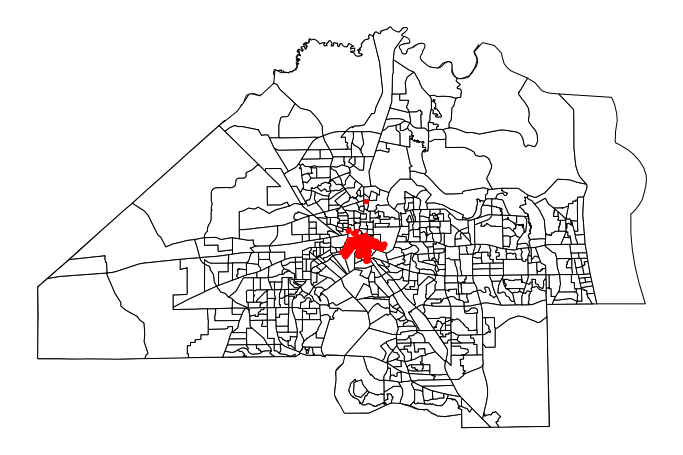

In [21]:
fl_county_boundary = gpd.read_file('Data/Florida/fl_county_boundary/fl_county_boundary.shp')
Duval_boundary = fl_county_boundary.loc[fl_county_boundary['COUNTY_NAM'] == 'DUVAL']
Duval_boundary['geometry'] = Duval_boundary['geometry'] .to_crs('epsg:4326')

fl_JAX_tract_att = gpd.GeoDataFrame(fl_JAX_tract_att)
JAX_scooter_data = gpd.GeoDataFrame(JAX_scooter_data)

# draw a base map of duval boundary
fig, ax = plt.subplots(1, figsize=(12,12))
divider = make_axes_locatable(ax)
base1 = Duval_boundary.plot(ax=ax, color = 'white', edgecolor = 'black') # color='#d3d3d3'
base2 = fl_JAX_tract_att.plot(ax=base1, color = 'white', edgecolor = 'black') # color='#e32636'
JAX_scooter_data.set_geometry('Start_coordinate').plot(ax=base2, markersize=20, color = 'red', legend=True)
plt.axis("off")

#### select census tracts with scooter data

In [22]:
# select those census tracts with real scooter data
scooter_data_tract_start_GEOID = JAX_scooter_data['Start_GEOID'].unique()
scooter_data_tract_end_GEOID = JAX_scooter_data['End_GEOID'].unique()
scooter_data_tract_GEOID = list(set(scooter_data_tract_start_GEOID).union(scooter_data_tract_end_GEOID))
scooter_data_tract_GEOID = pd.DataFrame({'GEOID': scooter_data_tract_GEOID})
scooter_data_tract_GEOID = scooter_data_tract_GEOID.merge(fl_JAX_tract_att, how = 'left', on = 'GEOID')

# ridership counts in the selected census tracts
centract_o_ridership_data = pd.DataFrame(JAX_scooter_data[['Start_GEOID']].value_counts()).reset_index()
centract_o_ridership_data = centract_o_ridership_data.rename(columns = {0: 'O_Ridership','Start_GEOID': 'GEOID'})
centract_d_ridership_data = pd.DataFrame(JAX_scooter_data[['End_GEOID']].value_counts()).reset_index()
centract_d_ridership_data = centract_d_ridership_data.rename(columns = {0: 'D_Ridership', 'End_GEOID': 'GEOID'})

scooter_data_tract_GEOID = scooter_data_tract_GEOID.merge(centract_o_ridership_data, how = 'left', on = 'GEOID')
scooter_data_tract_GEOID = scooter_data_tract_GEOID.merge(centract_d_ridership_data, how = 'left', on = 'GEOID')
scooter_data_tract_GEOID = gpd.GeoDataFrame(scooter_data_tract_GEOID)
scooter_data_tract_GEOID['TRACTBLK'] = scooter_data_tract_GEOID['TRACT'] + scooter_data_tract_GEOID['BLKGRP']
scooter_data_tract_GEOID = scooter_data_tract_GEOID.fillna(0)

scooter_data_tract_GEOID_merge = scooter_data_tract_GEOID.copy() # loc[scooter_data_tract_GEOID['O_Ridership'] >= 100].reset_index(drop=True)
merge_polygon = scooter_data_tract_GEOID_merge.iloc[0]['geometry']
### !!!!!!!!!!!!!!!!!
# thre_index = 19 # too large a polygon
# for j in range (1, thre_index):
#     merge_polygon = merge_polygon.union(scooter_data_tract_GEOID_merge.iloc[j]['geometry'])
# for j in range (thre_index + 1, len(scooter_data_tract_GEOID_merge)):
#     merge_polygon = merge_polygon.union(scooter_data_tract_GEOID_merge.iloc[j]['geometry'])

for i in range (1, len(scooter_data_tract_GEOID_merge)):
    merge_polygon = merge_polygon.union(scooter_data_tract_GEOID_merge.iloc[i]['geometry'])

merge_polygon = gpd.GeoDataFrame(geometry=[merge_polygon])

index_list_00 = scooter_data_tract_GEOID.sort_values(by='O_Ridership', ascending=False).index
print(index_list_00)
scooter_data_tract_GEOID.head()

Int64Index([19, 4, 14, 6, 2, 13, 15, 20, 1, 5, 17, 0, 11, 12, 9, 8, 3, 10, 16,
            7, 18],
           dtype='int64')


,GEOID,LAT,LON,ACRES,MED_AGE,AVE_HH_SZ,HS_PER_AC,PCT_WHITE,DEN_POP,PCT_MALE,...,Den_Bike_Lane,Den_Transit_Route,Den_Road_Network,coordinates,TRACT,BLKGRP,geometry,O_Ridership,D_Ridership,TRACTBLK
0,120310171021,30.315845,-81.682923,90.634169,49.4,1.57,6.24,77.91,11.19,0.439842,...,0.006076,4.843472,0.360699,POINT (-81.6829232 30.3158453),017102,1,"POLYGON ((-81.68530 30.32074, -81.68493 30.320...",2.0,7.0,0171021
1,120310010001,30.334630,-81.654391,154.885142,52.5,1.34,3.54,28.30,5.13,0.656604,...,0.000000,20.158693,0.128331,POINT (-81.6543909 30.3346305),001000,1,"POLYGON ((-81.66119 30.33361, -81.66111 30.333...",19.0,37.0,0010001
2,120310008001,30.312536,-81.663278,347.419768,51.0,1.40,2.20,73.09,2.48,0.479118,...,0.004422,2.197735,0.043506,POINT (-81.6632779 30.3125364),000800,1,"POLYGON ((-81.66774 30.31070, -81.66791 30.313...",1387.0,1518.0,0008001
3,120310171013,30.313510,-81.689507,89.043935,35.2,1.70,6.85,81.95,11.51,0.544390,...,0.000000,4.239456,0.081225,POINT (-81.6895069 30.3135104),017101,3,"POLYGON ((-81.69628 30.31419, -81.69569 30.314...",1.0,4.0,0171013
4,120310008002,30.315120,-81.648653,294.528803,49.4,1.56,3.79,72.20,4.19,0.504052,...,0.061114,1.160766,0.058773,POINT (-81.6486531 30.3151205),000800,2,"POLYGON ((-81.65902 30.31589, -81.65900 30.316...",3978.0,3857.0,0008002


In [23]:
len(scooter_data_tract_GEOID)

21

In [44]:
(1387+3978+2047+403+3711+15209)/26900

0.9938661710037174

In [45]:
(1518+3857+2010+548+4014+14700)/26900

0.9905947955390335

In [24]:
scooter_data_tract_GEOID.loc[scooter_data_tract_GEOID['O_Ridership'] > 100]

,GEOID,LAT,LON,ACRES,MED_AGE,AVE_HH_SZ,HS_PER_AC,PCT_WHITE,DEN_POP,PCT_MALE,...,Den_Bike_Lane,Den_Transit_Route,Den_Road_Network,coordinates,TRACT,BLKGRP,geometry,O_Ridership,D_Ridership,TRACTBLK
2,120310008001,30.312536,-81.663278,347.419768,51.0,1.40,2.20,73.09,2.48,0.479118,...,0.004422,2.197735,0.043506,POINT (-81.6632779 30.3125364),000800,1,"POLYGON ((-81.66774 30.31070, -81.66791 30.313...",1387.0,1518.0,0008001
4,120310008002,30.315120,-81.648653,294.528803,49.4,1.56,3.79,72.20,4.19,0.504052,...,0.061114,1.160766,0.058773,POINT (-81.6486531 30.3151205),000800,2,"POLYGON ((-81.65902 30.31589, -81.65900 30.316...",3978.0,3857.0,0008002
6,120310174002,30.330620,-81.630407,1973.396728,35.2,2.43,0.37,12.16,0.75,0.503360,...,0.000000,0.399217,0.014643,POINT (-81.6304071 30.3306197),017400,2,"POLYGON ((-81.64770 30.32606, -81.64764 30.326...",2047.0,2010.0,0174002
13,120310172002,30.334124,-81.668425,474.532701,41.2,1.76,1.39,23.54,2.64,0.487630,...,0.001742,4.509078,0.111172,POINT (-81.6684246 30.3341241),017200,2,"POLYGON ((-81.67657 30.32970, -81.67656 30.329...",403.0,548.0,0172002
14,120310171022,30.310921,-81.677634,1067.563032,40.3,1.37,1.21,71.34,1.71,0.499178,...,0.003268,0.489140,0.023629,POINT (-81.6776343 30.3109206),017102,2,"POLYGON ((-81.68181 30.32080, -81.68170 30.321...",3711.0,4014.0,0171022
19,120310172001,30.325884,-81.658872,423.688659,41.6,1.39,2.72,45.64,3.33,0.496097,...,0.002979,6.393644,0.096148,POINT (-81.6588721 30.3258838),017200,1,"POLYGON ((-81.67108 30.32665, -81.67089 30.326...",15209.0,14700.0,0172001


(array([5., 2., 2., 1., 0., 2., 1., 4., 2., 2.]),
 array([1.33 , 1.471, 1.612, 1.753, 1.894, 2.035, 2.176, 2.317, 2.458,
        2.599, 2.74 ]),
 <BarContainer object of 10 artists>)

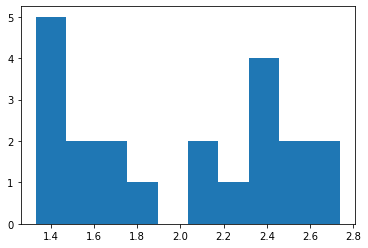

In [25]:
plt.hist(scooter_data_tract_GEOID['AVE_HH_SZ'], bins = 10)

(array([1., 1., 2., 2., 4., 2., 4., 0., 3., 2.]),
 array([23.3 , 26.22, 29.14, 32.06, 34.98, 37.9 , 40.82, 43.74, 46.66,
        49.58, 52.5 ]),
 <BarContainer object of 10 artists>)

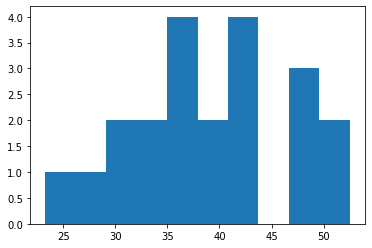

In [26]:
plt.hist(scooter_data_tract_GEOID['MED_AGE'], bins = 10)

(array([1., 4., 3., 2., 4., 3., 2., 0., 0., 2.]),
 array([0.37 , 1.018, 1.666, 2.314, 2.962, 3.61 , 4.258, 4.906, 5.554,
        6.202, 6.85 ]),
 <BarContainer object of 10 artists>)

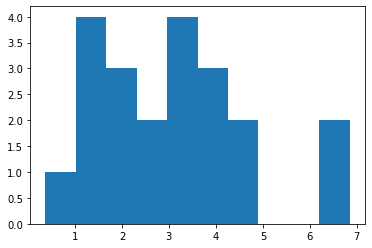

In [27]:
plt.hist(scooter_data_tract_GEOID['HS_PER_AC'], bins = 10)

(array([6., 1., 2., 0., 1., 3., 0., 0., 4., 4.]),
 array([ 4.34 , 12.439, 20.538, 28.637, 36.736, 44.835, 52.934, 61.033,
        69.132, 77.231, 85.33 ]),
 <BarContainer object of 10 artists>)

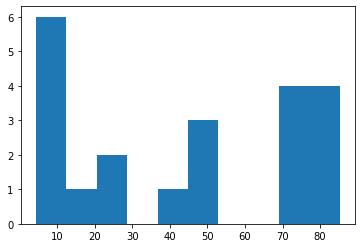

In [28]:
plt.hist(scooter_data_tract_GEOID['PCT_WHITE'], bins = 10)

(array([7., 6., 4., 3., 0., 0., 0., 0., 0., 1.]),
 array([ 0.75 ,  3.648,  6.546,  9.444, 12.342, 15.24 , 18.138, 21.036,
        23.934, 26.832, 29.73 ]),
 <BarContainer object of 10 artists>)

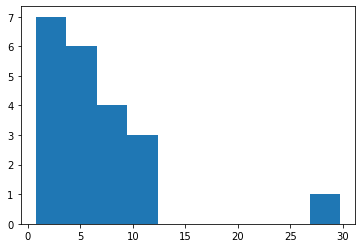

In [29]:
plt.hist(scooter_data_tract_GEOID['DEN_POP'], bins = 10)

(array([1., 3., 8., 6., 1., 0., 0., 1., 0., 1.]),
 array([0.38127544, 0.41838622, 0.45549701, 0.49260779, 0.52971858,
        0.56682936, 0.60394014, 0.64105093, 0.67816171, 0.7152725 ,
        0.75238328]),
 <BarContainer object of 10 artists>)

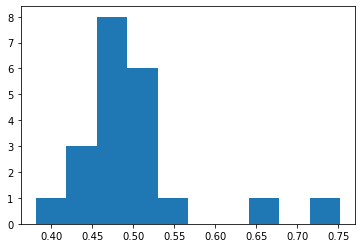

In [30]:
plt.hist(scooter_data_tract_GEOID['PCT_MALE'], bins = 10)

#### Start Ridership at census tract

C:\Users\Kaifa Lu\AppData\Local\Temp\ipykernel_22316\483507475.py:12: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  for x, y, label in zip(scooter_data_tract_GEOID_merge_high.geometry.centroid.x, scooter_data_tract_GEOID_merge_high.geometry.centroid.y, scooter_data_tract_GEOID_merge_high['TRACTBLK']):


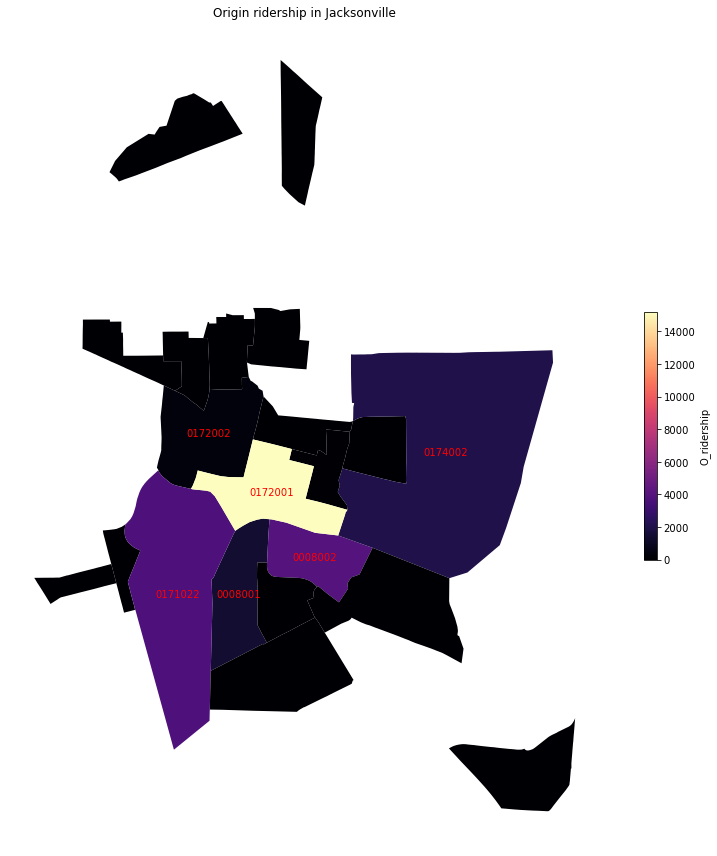

In [31]:
# for gis visualization

# O_ridership
fig, ax = plt.subplots(figsize=(12, 12))
ax.axis('off') # remove the axies
# base2 = merge_polygon.plot(ax=ax, color='#d3d3d3') #  fl_GNV_tract; fl_GNV_boundary
scooter_data_tract_GEOID_merge.plot(column = 'O_Ridership', cmap = 'magma', legend=True, alpha = 1.0, 
                                #vmin = 0, vmax =0.75, 
                             legend_kwds={'label': "O_ridership", 'orientation': "vertical", 'shrink': 0.3}, 
                             ax = ax)
scooter_data_tract_GEOID_merge_high = scooter_data_tract_GEOID_merge.loc[scooter_data_tract_GEOID_merge['O_Ridership'] > 100].reset_index(drop=True)
for x, y, label in zip(scooter_data_tract_GEOID_merge_high.geometry.centroid.x, scooter_data_tract_GEOID_merge_high.geometry.centroid.y, scooter_data_tract_GEOID_merge_high['TRACTBLK']):
    ax.text(x, y, label, fontsize=10, color='red', ha='center', va='center')
ax.set_title('Origin ridership in Jacksonville')
plt.tight_layout()
plt.show()

#### End ridership at census tracts

C:\Users\Kaifa Lu\AppData\Local\Temp\ipykernel_22316\1787330975.py:10: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  for x, y, label in zip(scooter_data_tract_GEOID_merge_high.geometry.centroid.x, scooter_data_tract_GEOID_merge_high.geometry.centroid.y, scooter_data_tract_GEOID_merge_high['TRACTBLK']):


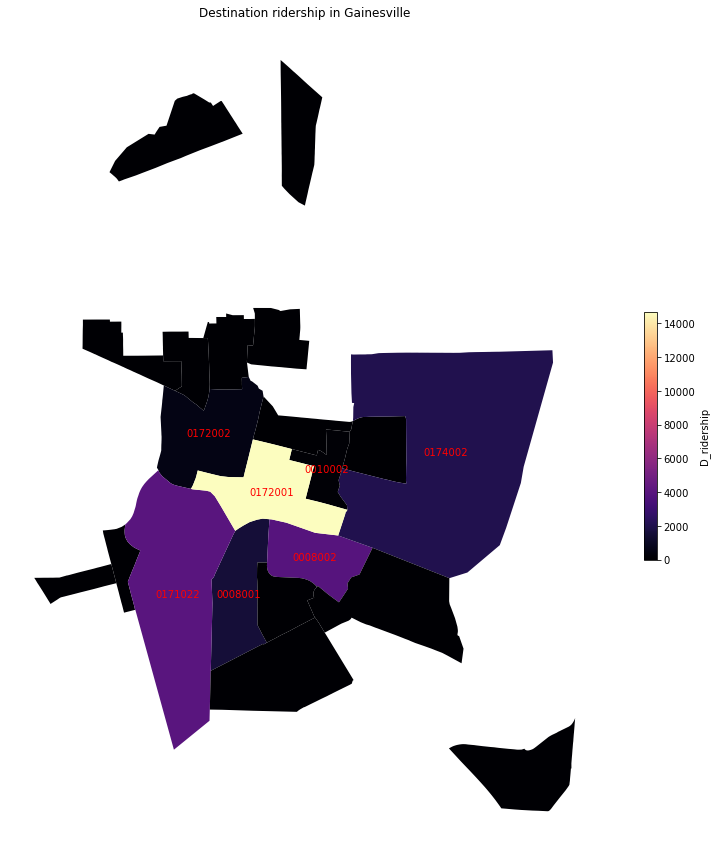

In [32]:
# D_ridership
fig, ax = plt.subplots(figsize=(12, 12))
ax.axis('off') # remove the axies
# base2 = merge_polygon.plot(ax=ax, color='#d3d3d3') #  fl_JAX_tract; fl_JAX_boundary
scooter_data_tract_GEOID_merge.plot(column = 'D_Ridership', cmap = 'magma', legend=True, alpha = 1.0, 
                                #vmin = 0, vmax =0.75, 
                             legend_kwds={'label': "D_ridership", 'orientation': "vertical", 'shrink': 0.3}, 
                             ax = ax) 
scooter_data_tract_GEOID_merge_high = scooter_data_tract_GEOID_merge.loc[scooter_data_tract_GEOID_merge['D_Ridership'] > 100].reset_index(drop=True)
for x, y, label in zip(scooter_data_tract_GEOID_merge_high.geometry.centroid.x, scooter_data_tract_GEOID_merge_high.geometry.centroid.y, scooter_data_tract_GEOID_merge_high['TRACTBLK']):
    ax.text(x, y, label, fontsize=10, color='red', ha='center', va='center')
ax.set_title('Destination ridership in Gainesville')
plt.tight_layout()
plt.show()

### Regression model input

In [33]:
regression_model_input_O = pd.read_csv('Data/Jacksonville/regression_model_input_O_new.csv')
regression_model_input_D = pd.read_csv('Data/Jacksonville/regression_model_input_D_new.csv')
regression_model_input_O['geometry'] = regression_model_input_O[['Start Longitude', 'Start Latitude']].values.tolist()
regression_model_input_O['geometry'] = regression_model_input_O['geometry'].apply(Point)
regression_model_input_D['geometry'] = regression_model_input_D[['End Longitude', 'End Latitude']].values.tolist()
regression_model_input_D['geometry'] = regression_model_input_D['geometry'].apply(Point)
regression_model_input_O.head()

,cluster,Start Latitude,Start Longitude,ridership,geometry,other_num_buff250,residential_num_buff250,education_num_buff250,cultural_num_buff250,recreational_num_buff250,...,pct_terrain,pct_sky,pct_person,pct_rider,pct_car,pct_truck,pct_bus,pct_train,pct_motorcycle,pct_bicycle
0,0,30.325581,-81.655385,3056,POINT (-81.65538482745099 30.325580785620915),0.0,0.0,0.0,4.0,8.0,...,0.008865,0.059939,0.005456,0.0,0.012106,0.000000,0.0,0.0,0.0,0.001847
1,1,30.327773,-81.661543,1406,POINT (-81.66154306818181 30.327772919421488),0.0,0.0,0.0,1.0,2.0,...,0.004450,0.067959,0.017838,0.0,0.029983,0.005722,0.0,0.0,0.0,0.000939
2,2,30.328892,-81.658779,1120,POINT (-81.6587786375 30.32889174375),0.0,2.0,0.0,1.0,4.0,...,0.001246,0.064573,0.019775,0.0,0.022735,0.000000,0.0,0.0,0.0,0.000000
3,3,30.325285,-81.661160,1028,POINT (-81.66115992898833 30.32528520330739),0.0,2.0,0.0,2.0,0.0,...,0.031118,0.073101,0.005203,0.0,0.003009,0.000000,0.0,0.0,0.0,0.000000
4,4,30.323735,-81.655858,993,POINT (-81.65585779744765 30.32373483802356),0.0,0.0,0.0,0.0,0.0,...,0.016444,0.078774,0.005182,0.0,0.073617,0.000000,0.0,0.0,0.0,0.007140


In [47]:
len(gpd.GeoDataFrame(regression_model_input_D))

122

In [48]:
len(gpd.GeoDataFrame(regression_model_input_O))

83

### Display OD Clusters

C:\Users\Kaifa Lu\AppData\Local\Temp\ipykernel_22316\1451189750.py:5: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  for x, y, label in zip(scooter_data_tract_GEOID_merge_high.geometry.centroid.x, scooter_data_tract_GEOID_merge_high.geometry.centroid.y, scooter_data_tract_GEOID_merge_high['TRACTBLK']):


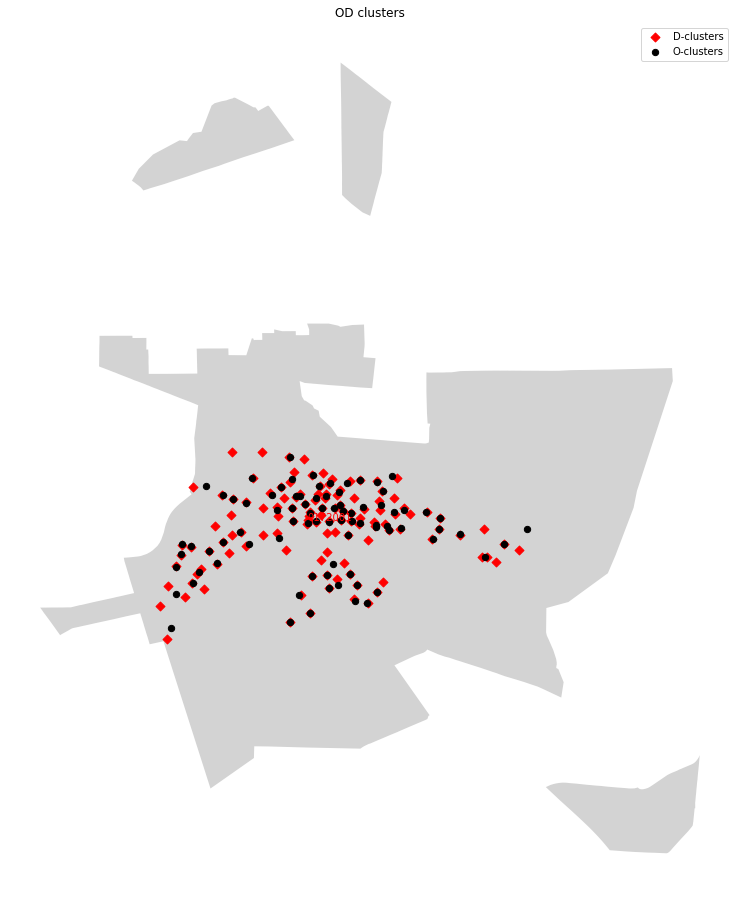

In [34]:
fig, ax = plt.subplots(figsize=(16, 16))
ax.axis('off') # remove the axies
base2 = merge_polygon.plot(ax=ax, color='#d3d3d3')
scooter_data_tract_GEOID_merge_high = scooter_data_tract_GEOID_merge.loc[scooter_data_tract_GEOID_merge['O_Ridership'] >= 10000].reset_index(drop=True)
for x, y, label in zip(scooter_data_tract_GEOID_merge_high.geometry.centroid.x, scooter_data_tract_GEOID_merge_high.geometry.centroid.y, scooter_data_tract_GEOID_merge_high['TRACTBLK']):
    ax.text(x, y, label, fontsize=10, color='red', ha='center', va='center')
ax.set_title('OD clusters')

gpd.GeoDataFrame(regression_model_input_D).plot(ax=ax, marker='D', markersize=40, color = 'red', label = 'D-clusters')
gpd.GeoDataFrame(regression_model_input_O).plot(ax=ax, marker='o', markersize=40, color = 'black', label = 'O-clusters')
plt.legend()
plt.show()

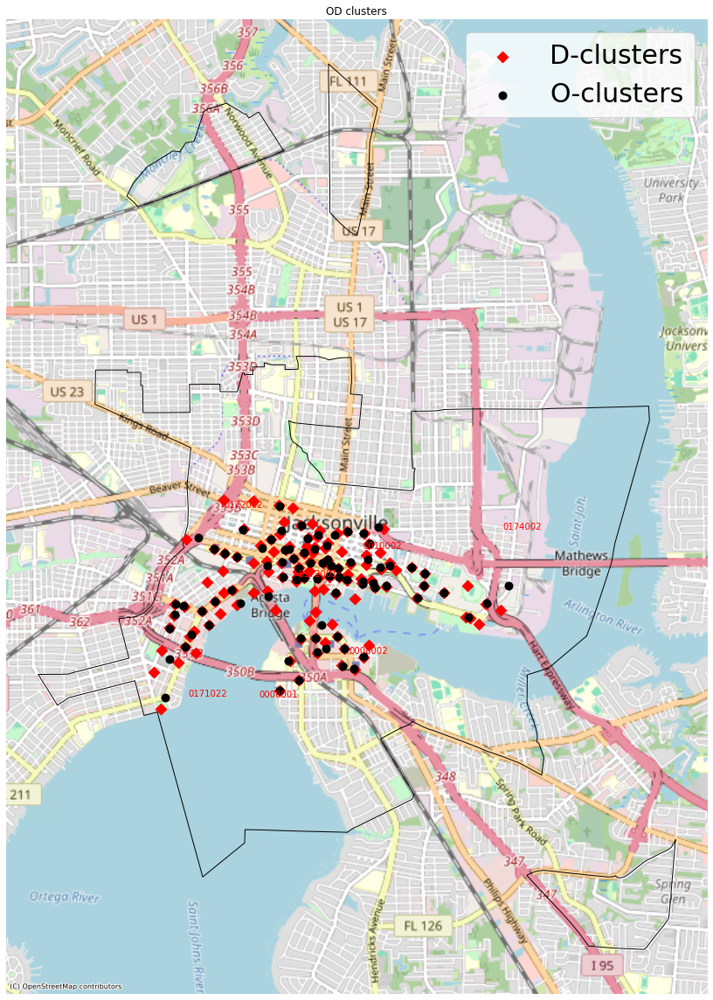

In [35]:
import contextily as ctx

fig, ax = plt.subplots(figsize=(16, 16))
ax.axis('off') # remove the axies
divider = make_axes_locatable(ax)
merge_polygon_new = merge_polygon.set_crs(epsg=4326).to_crs(epsg=3857)
base1 = merge_polygon_new.plot(ax=ax, edgecolor='black', facecolor='none')

scooter_data_tract_GEOID_merge_new = gpd.GeoDataFrame(scooter_data_tract_GEOID_merge)
scooter_data_tract_GEOID_merge_new['geometry'] = scooter_data_tract_GEOID_merge_new['geometry'].to_crs(epsg=3857)
scooter_data_tract_GEOID_merge_high_new = scooter_data_tract_GEOID_merge_new.loc[scooter_data_tract_GEOID_merge_new['O_Ridership'] >= 100].reset_index(drop=True)
for x, y, label in zip(scooter_data_tract_GEOID_merge_high_new.geometry.centroid.x, scooter_data_tract_GEOID_merge_high_new.geometry.centroid.y, scooter_data_tract_GEOID_merge_high_new['TRACTBLK']):
    ax.text(x, y, label, fontsize=10, color='red', ha='center', va='center')

JAX_scooter_data_GEOID_0_cluster_new = gpd.GeoDataFrame(regression_model_input_D)
JAX_scooter_data_GEOID_0_cluster_new['geometry'] = JAX_scooter_data_GEOID_0_cluster_new['geometry'].set_crs(epsg=4326).to_crs(epsg=3857)
JAX_scooter_data_GEOID_1_cluster_new = gpd.GeoDataFrame(regression_model_input_O)
JAX_scooter_data_GEOID_1_cluster_new['geometry'] = JAX_scooter_data_GEOID_1_cluster_new['geometry'].set_crs(epsg=4326).to_crs(epsg=3857)
JAX_scooter_data_GEOID_0_cluster_new.plot(ax=ax, marker='D', markersize=80, color = 'red', label = 'D-clusters')
JAX_scooter_data_GEOID_1_cluster_new.plot(ax=ax, marker='o', markersize=80, color = 'black', label = 'O-clusters')
plt.legend(fontsize=30)    
ax.set_title('OD clusters')    
plt.tight_layout()
ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik)
plt.show()

### Trip Origin Distribution

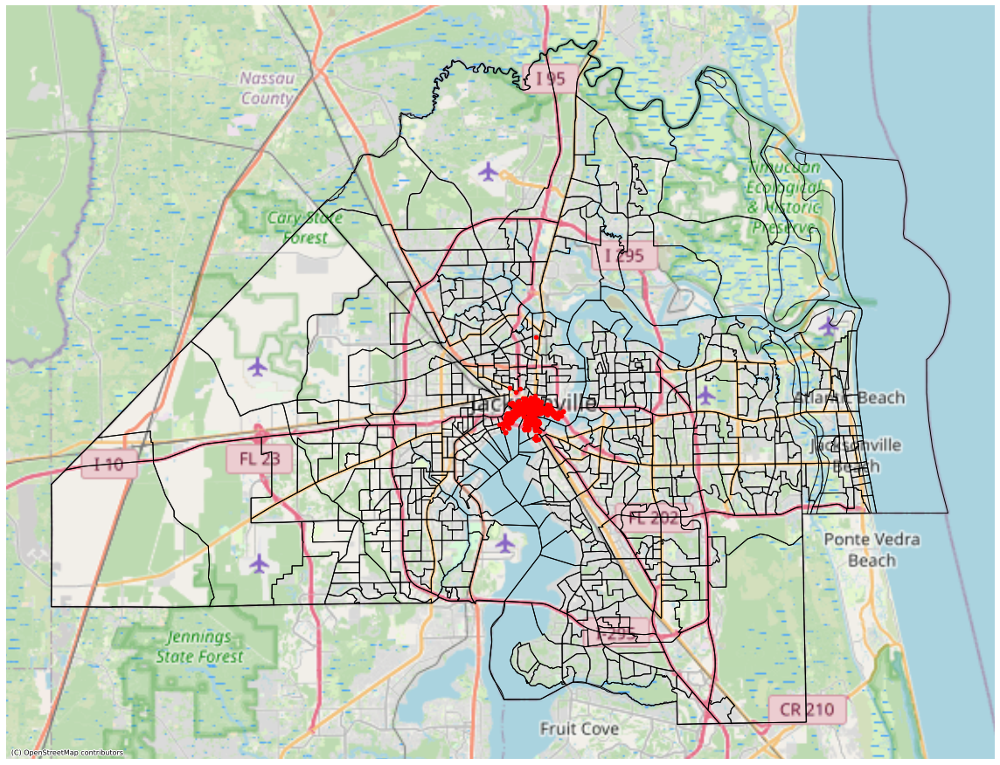

In [36]:
## Trip origins

import contextily as ctx

fig, ax = plt.subplots(figsize=(16, 16))
ax.axis('off') # remove the axies
divider = make_axes_locatable(ax)
Duval_boundary_new = Duval_boundary.to_crs(epsg=3857)
base1 = Duval_boundary_new.plot(ax=ax, edgecolor='black', facecolor='none')

fl_JAX_tract_att_new = gpd.GeoDataFrame(fl_JAX_tract_att)
fl_JAX_tract_att_new['geometry'] = fl_JAX_tract_att_new['geometry'].to_crs(epsg=3857)
base2 = fl_JAX_tract_att_new.plot(ax=base1, facecolor = 'none', edgecolor = 'black') # color='#e32636'

JAX_scooter_data_new_O = gpd.GeoDataFrame(JAX_scooter_data)
JAX_scooter_data_new_O = JAX_scooter_data_new_O.rename(columns = {'Start_coordinate': 'geometry'})
JAX_scooter_data_new_O = gpd.GeoDataFrame(JAX_scooter_data_new_O)
JAX_scooter_data_new_O['geometry'] = JAX_scooter_data_new_O['geometry'].set_crs(epsg=4326).to_crs(epsg=3857)
JAX_scooter_data_new_O.plot(ax=base2, markersize=20, color = 'red', legend=True)
plt.tight_layout()
ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik)
plt.show()

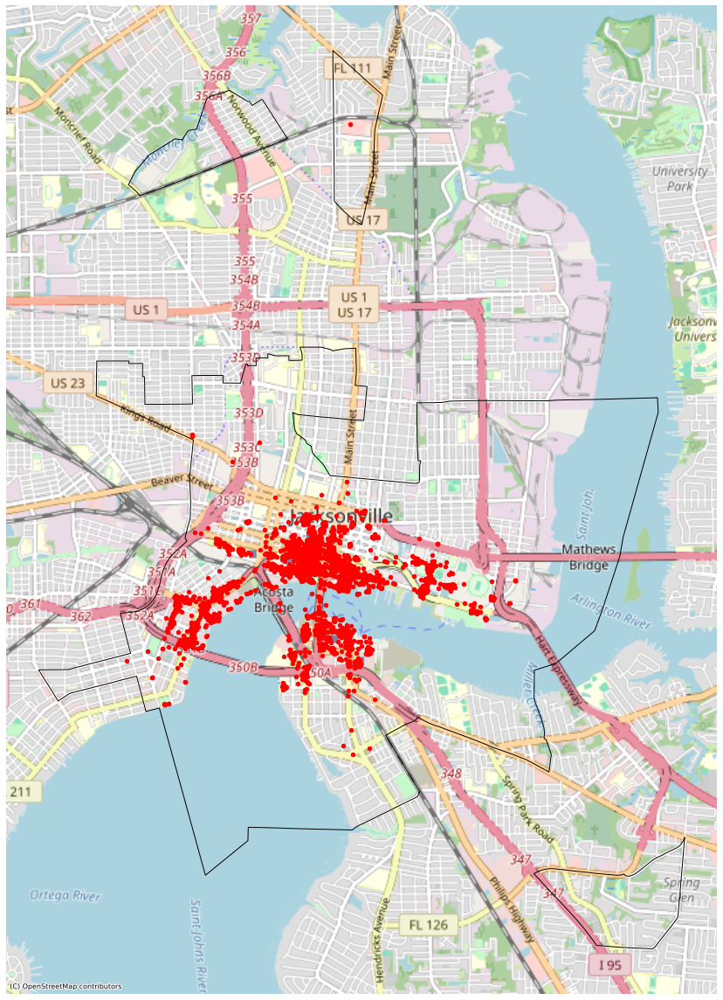

In [37]:
## Trip origins

import contextily as ctx

fig, ax = plt.subplots(figsize=(16, 16))
ax.axis('off') # remove the axies
divider = make_axes_locatable(ax)
merge_polygon_new = merge_polygon.set_crs(epsg=4326).to_crs(epsg=3857)
base1 = merge_polygon_new.plot(ax=ax, edgecolor='black', facecolor='none')

JAX_scooter_data_new_O = gpd.GeoDataFrame(JAX_scooter_data)
JAX_scooter_data_new_O = JAX_scooter_data_new_O.rename(columns = {'Start_coordinate': 'geometry'})
JAX_scooter_data_new_O = gpd.GeoDataFrame(JAX_scooter_data_new_O)
JAX_scooter_data_new_O['geometry'] = JAX_scooter_data_new_O['geometry'].set_crs(epsg=4326).to_crs(epsg=3857)
JAX_scooter_data_new_O.plot(ax=base1, markersize=20, color = 'red', legend=True)
plt.tight_layout()
ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik)
plt.show()

### Trip Destination Distribution

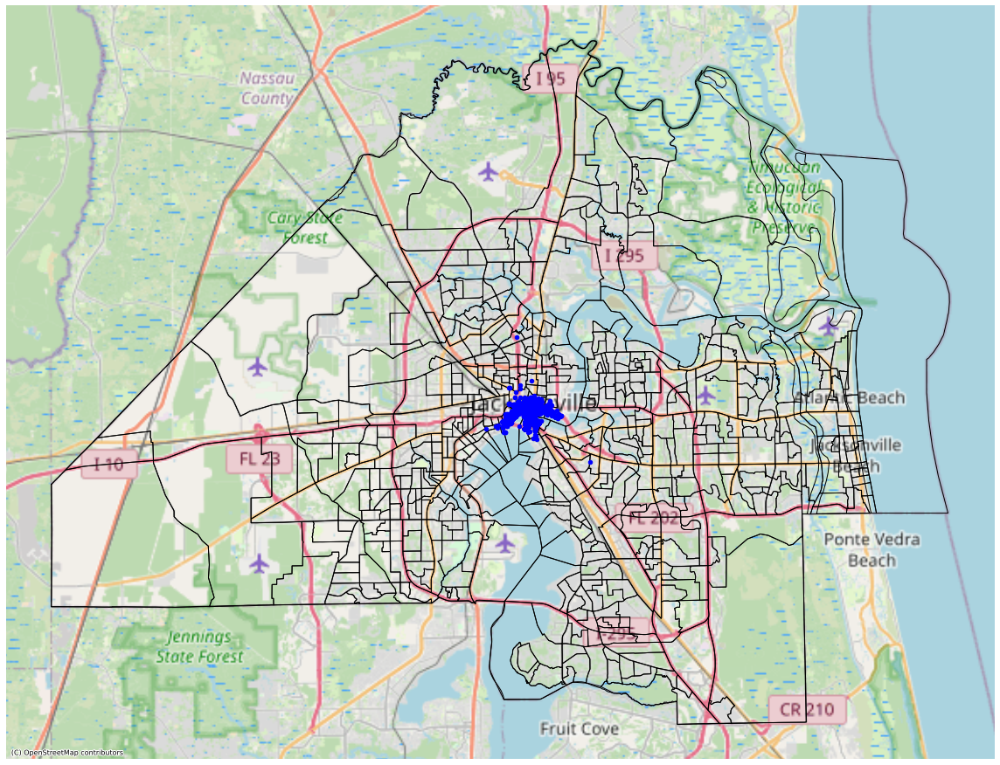

In [38]:
## Trip destinations

import contextily as ctx

fig, ax = plt.subplots(figsize=(16, 16))
ax.axis('off') # remove the axies
divider = make_axes_locatable(ax)
Duval_boundary_new = Duval_boundary.to_crs(epsg=3857)
base1 = Duval_boundary_new.plot(ax=ax, edgecolor='black', facecolor='none')

fl_JAX_tract_att_new = gpd.GeoDataFrame(fl_JAX_tract_att)
fl_JAX_tract_att_new['geometry'] = fl_JAX_tract_att_new['geometry'].to_crs(epsg=3857)
base2 = fl_JAX_tract_att_new.plot(ax=base1, facecolor = 'none', edgecolor = 'black') # color='#e32636'

JAX_scooter_data_new_D = gpd.GeoDataFrame(JAX_scooter_data)
JAX_scooter_data_new_D = JAX_scooter_data_new_D.rename(columns = {'End_coordinate': 'geometry'})
JAX_scooter_data_new_D = gpd.GeoDataFrame(JAX_scooter_data_new_D)
JAX_scooter_data_new_D['geometry'] = JAX_scooter_data_new_D['geometry'].set_crs(epsg=4326).to_crs(epsg=3857)
JAX_scooter_data_new_D.plot(ax=base2, markersize=20, color = 'blue', legend=True)
plt.tight_layout()
ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik)
plt.show()

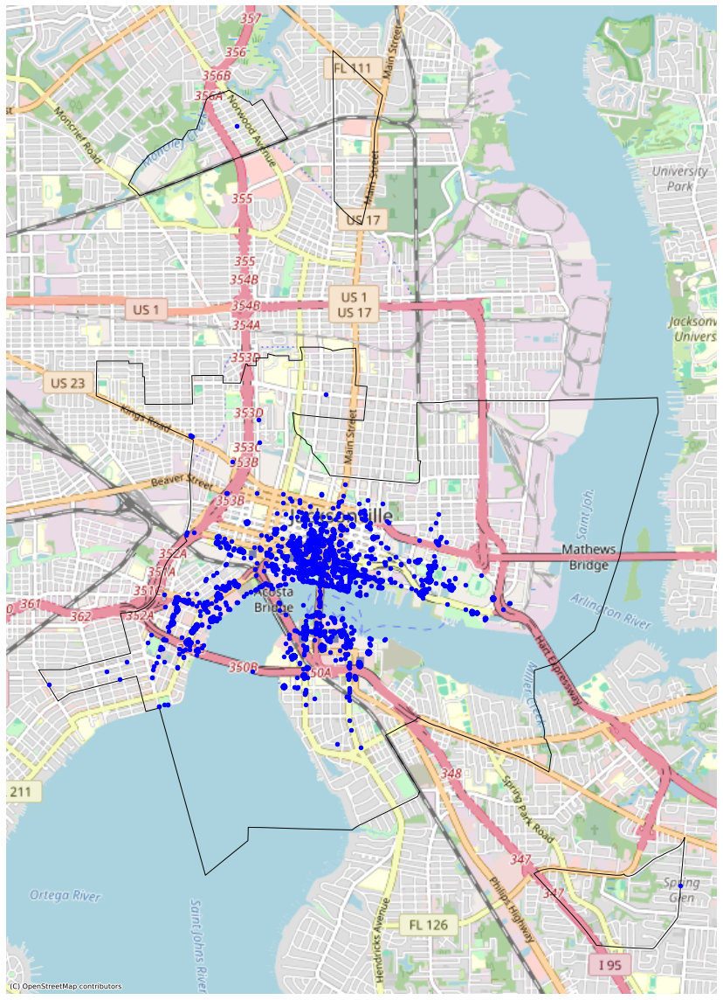

In [39]:
## Trip destinations

import contextily as ctx

fig, ax = plt.subplots(figsize=(16, 16))
ax.axis('off') # remove the axies
divider = make_axes_locatable(ax)
merge_polygon_new = merge_polygon.set_crs(epsg=4326).to_crs(epsg=3857)
base1 = merge_polygon_new.plot(ax=ax, edgecolor='black', facecolor='none')

JAX_scooter_data_new_D = gpd.GeoDataFrame(JAX_scooter_data)
JAX_scooter_data_new_D = JAX_scooter_data_new_D.rename(columns = {'End_coordinate': 'geometry'})
JAX_scooter_data_new_D = gpd.GeoDataFrame(JAX_scooter_data_new_D)
JAX_scooter_data_new_D['geometry'] = JAX_scooter_data_new_D['geometry'].set_crs(epsg=4326).to_crs(epsg=3857)
JAX_scooter_data_new_D.plot(ax=base1, markersize=20, color = 'blue', legend=True)
plt.tight_layout()
ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik)
plt.show()

### Trip Origins at Census Tracts

C:\Users\Kaifa Lu\AppData\Local\Temp\ipykernel_18604\3859510158.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  scooter_data_tract_GEOID_merge_new['O_Ridership'].loc[scooter_data_tract_GEOID_merge_new['O_Ridership'] == 0] = 1


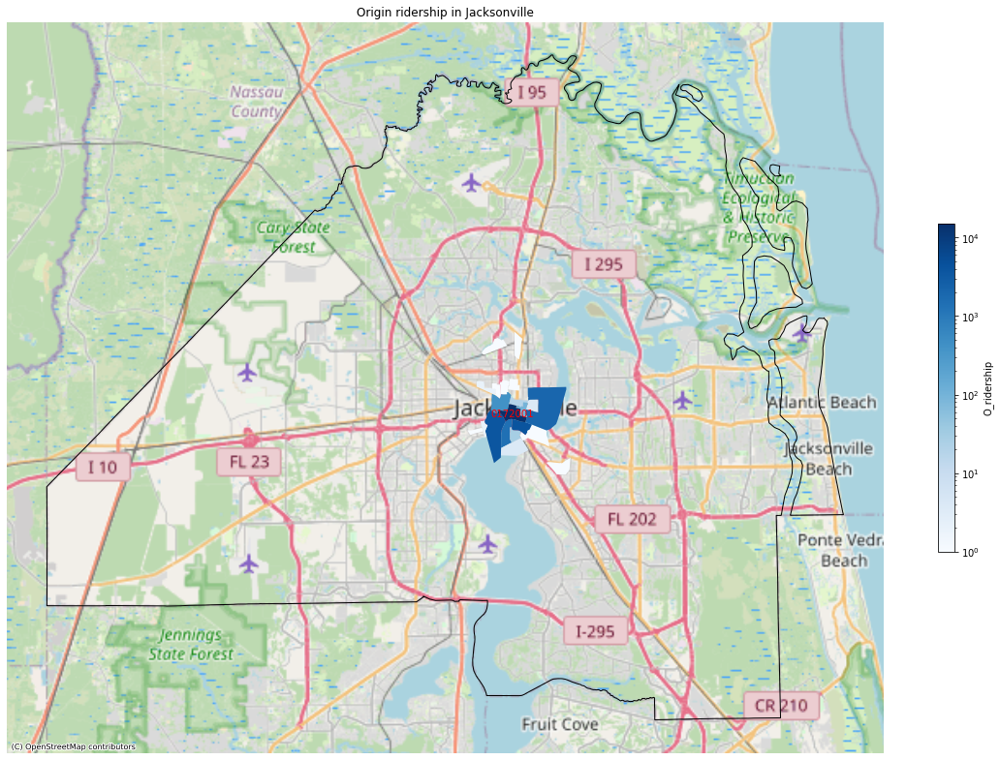

In [40]:
import contextily as ctx
from matplotlib.colors import LogNorm

scooter_data_tract_GEOID_merge_new = gpd.GeoDataFrame(scooter_data_tract_GEOID_merge)
scooter_data_tract_GEOID_merge_new['geometry'] = scooter_data_tract_GEOID_merge_new['geometry'].to_crs(epsg=3857)

fig, ax = plt.subplots(figsize=(16, 16))
ax.axis('off') # remove the axies
divider = make_axes_locatable(ax)

# Create a colormap with the specified colors
cmap = plt.cm.Blues
norm = LogNorm(vmin=1, vmax=max(scooter_data_tract_GEOID_merge_new['O_Ridership']))

scooter_data_tract_GEOID_merge_new['O_Ridership'].loc[scooter_data_tract_GEOID_merge_new['O_Ridership'] == 0] = 1

Duval_boundary_new = Duval_boundary.to_crs(epsg=3857)
base1 = Duval_boundary_new.plot(ax=ax, edgecolor='black', facecolor='none')

scooter_data_tract_GEOID_merge_new.plot(column = 'O_Ridership', cmap=cmap, norm=norm, legend=True, alpha = 1.0, 
                                #vmin = 0, vmax =0.75, 
                             legend_kwds={'label': "O_ridership", 'orientation': "vertical", 'shrink': 0.3}, 
                             ax = ax)
scooter_data_tract_GEOID_merge_high_new = scooter_data_tract_GEOID_merge_new.loc[scooter_data_tract_GEOID_merge_new['O_Ridership'] >= 10000].reset_index(drop=True)
for x, y, label in zip(scooter_data_tract_GEOID_merge_high_new.geometry.centroid.x, scooter_data_tract_GEOID_merge_high_new.geometry.centroid.y, scooter_data_tract_GEOID_merge_high_new['TRACTBLK']):
    ax.text(x, y, label, fontsize=10, color='red', ha='center', va='center')
ax.set_title('Origin ridership in Jacksonville')
plt.tight_layout()
ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik)
plt.show()

C:\Users\Kaifa Lu\AppData\Local\Temp\ipykernel_18604\1212271316.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  scooter_data_tract_GEOID_merge_new['O_Ridership'].loc[scooter_data_tract_GEOID_merge_new['O_Ridership'] == 0] = 1


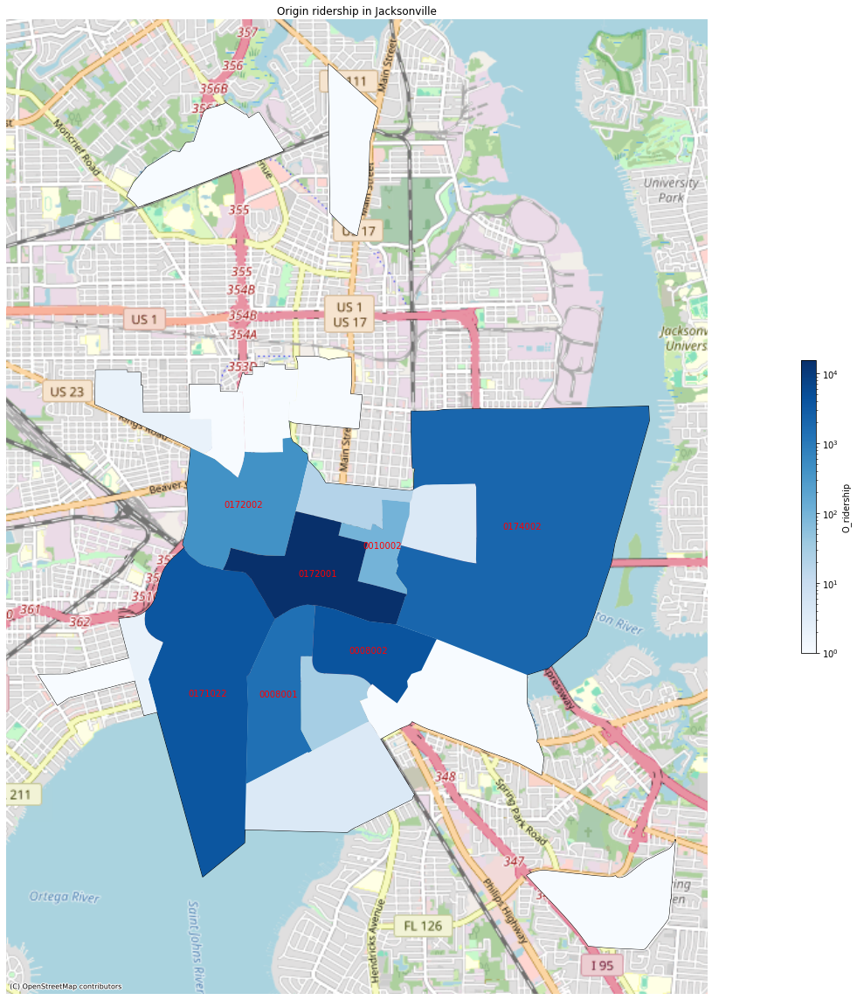

In [41]:
import contextily as ctx
from matplotlib.colors import LogNorm

scooter_data_tract_GEOID_merge_new = gpd.GeoDataFrame(scooter_data_tract_GEOID_merge)
scooter_data_tract_GEOID_merge_new['geometry'] = scooter_data_tract_GEOID_merge_new['geometry'].to_crs(epsg=3857)

fig, ax = plt.subplots(figsize=(16, 16))
ax.axis('off') # remove the axies
divider = make_axes_locatable(ax)

# Create a colormap with the specified colors
cmap = plt.cm.Blues
norm = LogNorm(vmin=1, vmax=max(scooter_data_tract_GEOID_merge_new['O_Ridership']))

scooter_data_tract_GEOID_merge_new['O_Ridership'].loc[scooter_data_tract_GEOID_merge_new['O_Ridership'] == 0] = 1

merge_polygon_new = merge_polygon.set_crs(epsg=4326).to_crs(epsg=3857)
base1 = merge_polygon_new.plot(ax=ax, edgecolor='black', facecolor='none')

scooter_data_tract_GEOID_merge_new.plot(column = 'O_Ridership', cmap=cmap, norm=norm, legend=True, alpha = 1.0, 
                                #vmin = 0, vmax =0.75, 
                             legend_kwds={'label': "O_ridership", 'orientation': "vertical", 'shrink': 0.3}, 
                             ax = ax)
scooter_data_tract_GEOID_merge_high_new = scooter_data_tract_GEOID_merge_new.loc[scooter_data_tract_GEOID_merge_new['O_Ridership'] >= 100].reset_index(drop=True)
for x, y, label in zip(scooter_data_tract_GEOID_merge_high_new.geometry.centroid.x, scooter_data_tract_GEOID_merge_high_new.geometry.centroid.y, scooter_data_tract_GEOID_merge_high_new['TRACTBLK']):
    ax.text(x, y, label, fontsize=10, color='red', ha='center', va='center')
ax.set_title('Origin ridership in Jacksonville')
plt.tight_layout()
ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik)
plt.show()

### Trip Destination at Census Tracts

C:\Users\Kaifa Lu\AppData\Local\Temp\ipykernel_18604\4015003310.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  scooter_data_tract_GEOID_merge_new['D_Ridership'].loc[scooter_data_tract_GEOID_merge_new['D_Ridership'] == 0] = 1


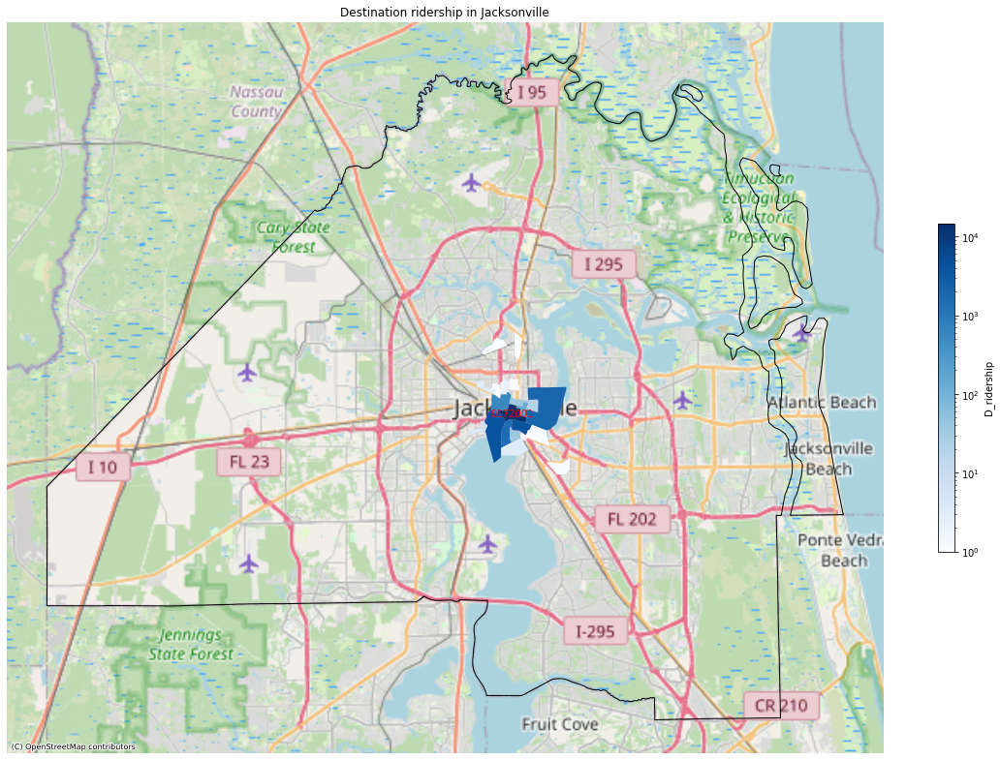

In [42]:
import contextily as ctx


scooter_data_tract_GEOID_merge_new = gpd.GeoDataFrame(scooter_data_tract_GEOID_merge)
scooter_data_tract_GEOID_merge_new['geometry'] = scooter_data_tract_GEOID_merge_new['geometry'].to_crs(epsg=3857)

fig, ax = plt.subplots(figsize=(16, 16))
ax.axis('off') # remove the axies
divider = make_axes_locatable(ax)

# Create a colormap with the specified colors
cmap = plt.cm.Blues
norm = LogNorm(vmin=1, vmax=max(scooter_data_tract_GEOID_merge_new['D_Ridership']))

scooter_data_tract_GEOID_merge_new['D_Ridership'].loc[scooter_data_tract_GEOID_merge_new['D_Ridership'] == 0] = 1

Duval_boundary_new = Duval_boundary.to_crs(epsg=3857)
base1 = Duval_boundary_new.plot(ax=ax, edgecolor='black', facecolor='none')

scooter_data_tract_GEOID_merge_new.plot(column = 'D_Ridership', cmap = cmap, norm = norm, legend=True, alpha = 1.0, 
                                #vmin = 0, vmax =0.75, 
                             legend_kwds={'label': "D_ridership", 'orientation': "vertical", 'shrink': 0.3}, 
                             ax = ax)
scooter_data_tract_GEOID_merge_high_new = scooter_data_tract_GEOID_merge_new.loc[scooter_data_tract_GEOID_merge_new['D_Ridership'] >= 10000].reset_index(drop=True)
for x, y, label in zip(scooter_data_tract_GEOID_merge_high_new.geometry.centroid.x, scooter_data_tract_GEOID_merge_high_new.geometry.centroid.y, scooter_data_tract_GEOID_merge_high_new['TRACTBLK']):
    ax.text(x, y, label, fontsize=10, color='red', ha='center', va='center')
ax.set_title('Destination ridership in Jacksonville')
plt.tight_layout()
ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik)
plt.show()

C:\Users\Kaifa Lu\AppData\Local\Temp\ipykernel_18604\38326827.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  scooter_data_tract_GEOID_merge_new['D_Ridership'].loc[scooter_data_tract_GEOID_merge_new['D_Ridership'] == 0] = 1


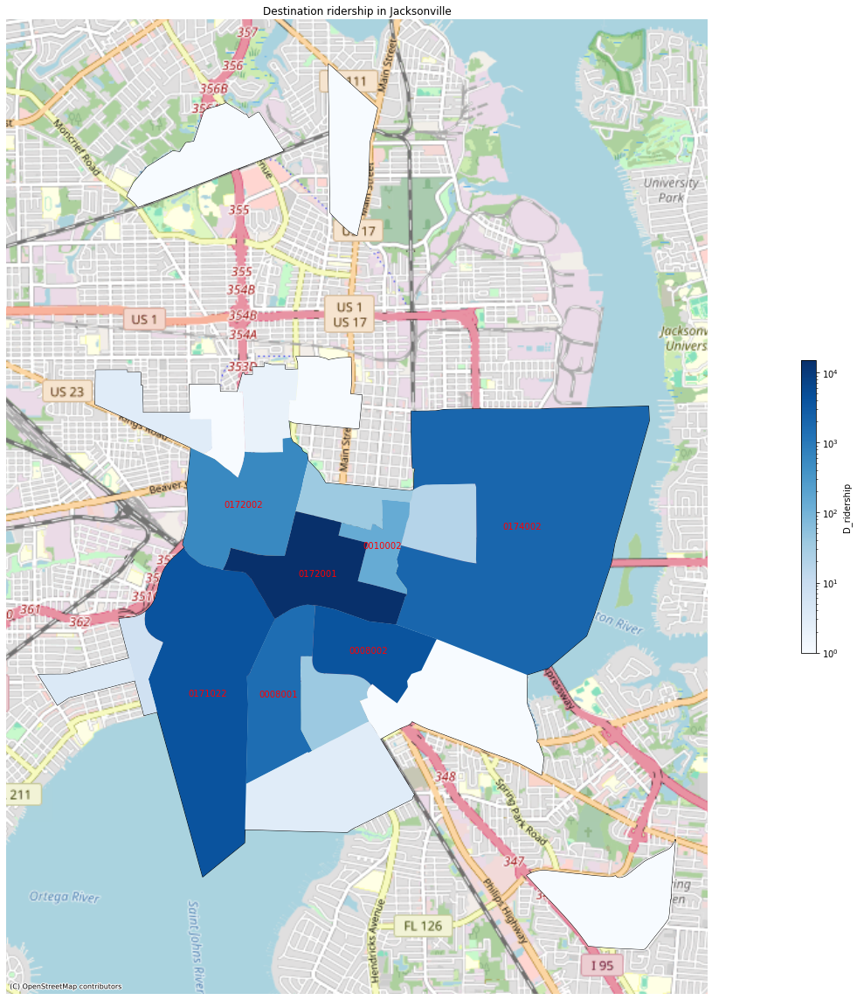

In [43]:
import contextily as ctx


scooter_data_tract_GEOID_merge_new = gpd.GeoDataFrame(scooter_data_tract_GEOID_merge)
scooter_data_tract_GEOID_merge_new['geometry'] = scooter_data_tract_GEOID_merge_new['geometry'].to_crs(epsg=3857)

fig, ax = plt.subplots(figsize=(16, 16))
ax.axis('off') # remove the axies
divider = make_axes_locatable(ax)

# Create a colormap with the specified colors
cmap = plt.cm.Blues
norm = LogNorm(vmin=1, vmax=max(scooter_data_tract_GEOID_merge_new['D_Ridership']))

scooter_data_tract_GEOID_merge_new['D_Ridership'].loc[scooter_data_tract_GEOID_merge_new['D_Ridership'] == 0] = 1

merge_polygon_new = merge_polygon.set_crs(epsg=4326).to_crs(epsg=3857)
base1 = merge_polygon_new.plot(ax=ax, edgecolor='black', facecolor='none')

scooter_data_tract_GEOID_merge_new.plot(column = 'D_Ridership', cmap = cmap, norm = norm, legend=True, alpha = 1.0, 
                                #vmin = 0, vmax =0.75, 
                             legend_kwds={'label': "D_ridership", 'orientation': "vertical", 'shrink': 0.3}, 
                             ax = ax)
scooter_data_tract_GEOID_merge_high_new = scooter_data_tract_GEOID_merge_new.loc[scooter_data_tract_GEOID_merge_new['D_Ridership'] >= 100].reset_index(drop=True)
for x, y, label in zip(scooter_data_tract_GEOID_merge_high_new.geometry.centroid.x, scooter_data_tract_GEOID_merge_high_new.geometry.centroid.y, scooter_data_tract_GEOID_merge_high_new['TRACTBLK']):
    ax.text(x, y, label, fontsize=10, color='red', ha='center', va='center')
ax.set_title('Destination ridership in Jacksonville')
plt.tight_layout()
ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik)
plt.show()

### Trip Overlapping With Bike Lane Networks

In [40]:
fl_county_bike_lane = gpd.read_file('Data/Florida/bike_lane_2023/bike_lane_jul23.shp')
fl_duval_bike_lane = fl_county_bike_lane.loc[fl_county_bike_lane['COUNTY'] == 'DUVAL']
fl_duval_bike_lane['geometry'] = fl_duval_bike_lane['geometry'].to_crs('epsg:4326')
fl_duval_bike_lane.head()

D:\Software\Anaconda\Install\envs\gpd_env\lib\site-packages\geopandas\geodataframe.py:1543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


,ROADWAY,ROAD_SIDE,LNCD,DESCR,DISTRICT,COUNTYDOT,COUNTY,MNG_DIST,BEGIN_POST,END_POST,DESCRIPT,FGDLAQDATE,AUTOID,SHAPE_LEN,geometry
3397,72000083,R,1,DESIGNATED,2,72,DUVAL,2,0.000,2.424,DESIGNATED,2023-07-11,6373,3905.848132,"LINESTRING (-81.58028 30.15035, -81.57874 30.1..."
3439,72000131,R,1,DESIGNATED,2,72,DUVAL,2,0.052,0.461,DESIGNATED,2023-07-11,7346,659.302498,"LINESTRING (-81.78040 30.26968, -81.77922 30.2..."
3497,72000034,L,1,DESIGNATED,2,72,DUVAL,2,0.048,0.252,DESIGNATED,2023-07-11,6751,334.941346,"LINESTRING (-81.68192 30.31715, -81.68135 30.3..."
3499,72680501,L,1,DESIGNATED,2,72,DUVAL,2,0.000,0.940,DESIGNATED,2023-07-11,6753,1516.595987,"LINESTRING (-81.59956 30.16045, -81.59966 30.1..."
3510,72000072,L,1,DESIGNATED,2,72,DUVAL,2,0.000,1.884,DESIGNATED,2023-07-11,6764,3033.612359,"LINESTRING (-81.60795 30.23969, -81.60805 30.2..."


#### Trip Origins

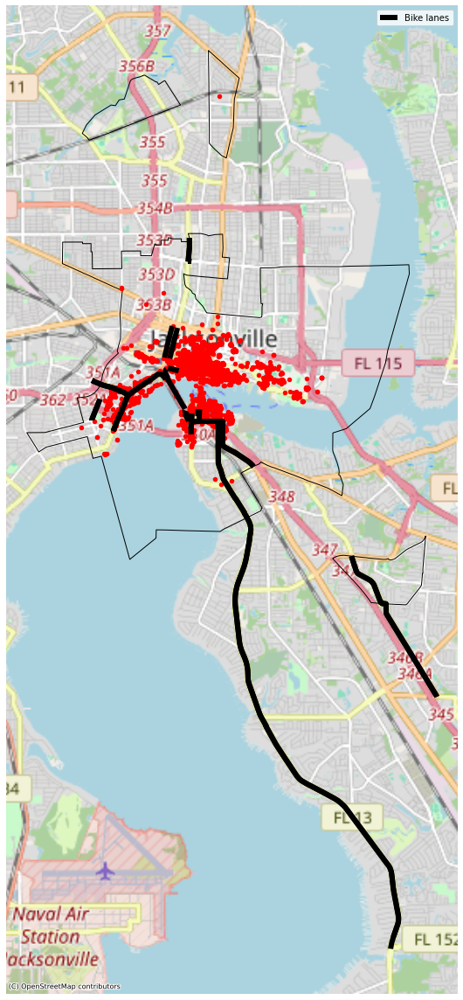

In [42]:
## Trip origins

import contextily as ctx

fig, ax = plt.subplots(figsize=(16, 16))
ax.axis('off') # remove the axies
divider = make_axes_locatable(ax)

merge_polygon_new = merge_polygon.set_crs(epsg=4326).to_crs(epsg=3857)
base1 = merge_polygon_new.plot(ax=ax, edgecolor='black', facecolor='none')

# add bike lane map
fl_duval_bike_lane_new = fl_duval_bike_lane.to_crs(epsg=3857)
contain_intersect_bike_lane_index = []
for ii in range(len(fl_duval_bike_lane_new)):
    if (merge_polygon_new.contains(fl_duval_bike_lane_new.iloc[ii].geometry)[0]):
        contain_intersect_bike_lane_index.append(ii)
    elif (merge_polygon_new.intersects(fl_duval_bike_lane_new.iloc[ii].geometry)[0]):
        contain_intersect_bike_lane_index.append(ii)
base2 = fl_duval_bike_lane_new.iloc[contain_intersect_bike_lane_index].plot(ax=base1, color='black', linewidth = 6)

JAX_scooter_data_new_O = gpd.GeoDataFrame(JAX_scooter_data)
JAX_scooter_data_new_O = JAX_scooter_data_new_O.rename(columns = {'Start_coordinate': 'geometry'})
JAX_scooter_data_new_O = gpd.GeoDataFrame(JAX_scooter_data_new_O)
JAX_scooter_data_new_O['geometry'] = JAX_scooter_data_new_O['geometry'].set_crs(epsg=4326).to_crs(epsg=3857)
JAX_scooter_data_new_O.plot(ax=base1, markersize=20, color = 'red', legend=True)

plt.legend(['Bike lanes'])

plt.tight_layout()
ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik)
plt.show()

#### Trip Destinations

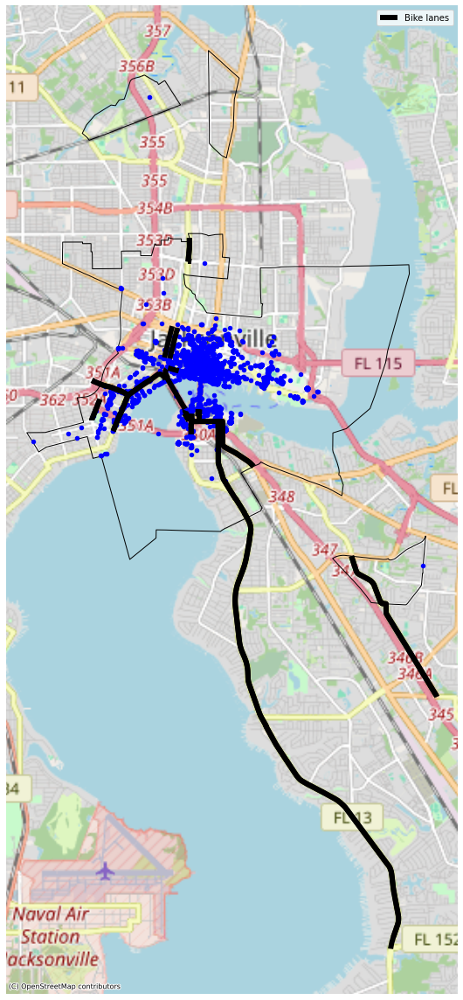

In [43]:
## Trip destinations

import contextily as ctx

fig, ax = plt.subplots(figsize=(16, 16))
ax.axis('off') # remove the axies
divider = make_axes_locatable(ax)
merge_polygon_new = merge_polygon.set_crs(epsg=4326).to_crs(epsg=3857)
base1 = merge_polygon_new.plot(ax=ax, edgecolor='black', facecolor='none')

# add bike lane map
fl_duval_bike_lane_new = fl_duval_bike_lane.to_crs(epsg=3857)
contain_intersect_bike_lane_index = []
for ii in range(len(fl_duval_bike_lane_new)):
    if (merge_polygon_new.contains(fl_duval_bike_lane_new.iloc[ii].geometry)[0]):
        contain_intersect_bike_lane_index.append(ii)
    elif (merge_polygon_new.intersects(fl_duval_bike_lane_new.iloc[ii].geometry)[0]):
        contain_intersect_bike_lane_index.append(ii)
base2 = fl_duval_bike_lane_new.iloc[contain_intersect_bike_lane_index].plot(ax=base1, color='black', linewidth = 6)

JAX_scooter_data_new_D = gpd.GeoDataFrame(JAX_scooter_data)
JAX_scooter_data_new_D = JAX_scooter_data_new_D.rename(columns = {'End_coordinate': 'geometry'})
JAX_scooter_data_new_D = gpd.GeoDataFrame(JAX_scooter_data_new_D)
JAX_scooter_data_new_D['geometry'] = JAX_scooter_data_new_D['geometry'].set_crs(epsg=4326).to_crs(epsg=3857)
JAX_scooter_data_new_D.plot(ax=base1, markersize=20, color = 'blue', legend=True)

plt.legend(['Bike lanes'])

plt.tight_layout()
ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik)
plt.show()

In [46]:
fl_duval_bike_lane_new.iloc[contain_intersect_bike_lane_index]

,ROADWAY,ROAD_SIDE,LNCD,DESCR,DISTRICT,COUNTYDOT,COUNTY,MNG_DIST,BEGIN_POST,END_POST,DESCRIPT,FGDLAQDATE,AUTOID,SHAPE_LEN,geometry
3497,72000034,L,1,DESIGNATED,2,72,DUVAL,2,0.048,0.252,DESIGNATED,2023-07-11,6751,334.941346,"LINESTRING (-9092789.504 3544382.452, -9092726..."
4248,72000068,R,5,SHARROW,2,72,DUVAL,2,1.337,1.432,SHARROW,2023-07-11,6093,153.734392,"LINESTRING (-9090488.541 3548130.635, -9090487..."
4413,72000068,R,2,BUFFERED,2,72,DUVAL,2,1.432,1.523,BUFFERED,2023-07-11,7105,147.432603,"LINESTRING (-9090471.630 3548308.508, -9090456..."
4515,72000078,L,1,DESIGNATED,2,72,DUVAL,2,0.000,2.196,DESIGNATED,2023-07-11,6512,3555.821469,"LINESTRING (-9084474.813 3537619.618, -9084487..."
4621,72000166,R,5,SHARROW,2,72,DUVAL,2,0.053,0.469,SHARROW,2023-07-11,6192,672.632768,"LINESTRING (-9091060.703 3545814.556, -9091017..."
4669,72000157,L,5,SHARROW,2,72,DUVAL,2,0.000,0.167,SHARROW,2023-07-11,7177,267.397900,"LINESTRING (-9090414.099 3543961.758, -9090414..."
4840,72000068,L,2,BUFFERED,2,72,DUVAL,2,1.432,1.523,BUFFERED,2023-07-11,6234,147.432603,"LINESTRING (-9090471.630 3548308.508, -9090456..."
5177,72000034,R,1,DESIGNATED,2,72,DUVAL,2,0.048,0.288,DESIGNATED,2023-07-11,5846,393.829832,"LINESTRING (-9092789.504 3544382.452, -9092726..."
5210,72000036,R,1,DESIGNATED,2,72,DUVAL,2,0.566,1.076,DESIGNATED,2023-07-11,6324,821.474469,"LINESTRING (-9092811.724 3545267.944, -9092799..."
5288,72000068,L,5,SHARROW,2,72,DUVAL,2,1.337,1.432,SHARROW,2023-07-11,7342,153.734392,"LINESTRING (-9090488.541 3548130.635, -9090487..."


### POI Data

In [49]:
fl_duval_poi = gpd.read_file('Data/Jacksonville/duval_county_poi.geojson')
print(len(fl_duval_poi))
fl_duval_poi.head()

8566


,element_type,osmid,amenity,ele,name,geometry
0,node,358691064,place_of_worship,14,Arlington Alliance Church,POINT (-81.57120 30.35163)
1,node,358691684,place_of_worship,19;6,Bethel Missionary Baptist Church,POINT (-81.76492 30.27249)
2,node,358691754,place_of_worship,4,Bethlehem Church,POINT (-81.40536 30.29557)
3,node,358692219,place_of_worship,15,Blessed Trinity Church,POINT (-81.54203 30.28218)
4,node,358692566,place_of_worship,11,Brookview Church,POINT (-81.53363 30.32289)


In [50]:
len(fl_duval_poi['amenity'].unique())

84

### Descriptive Statistics

In [51]:
len(regression_model_input_O)

83

In [52]:
len(regression_model_input_D)

122

In [53]:
regression_model_input_O.columns

Index(['cluster', 'Start Latitude', 'Start Longitude', 'ridership', 'geometry',
       'other_num_buff250', 'residential_num_buff250', 'education_num_buff250',
       'cultural_num_buff250', 'recreational_num_buff250',
       'social_num_buff250', 'transportation_num_buff250',
       'commercial_num_buff250', 'government_num_buff250',
       'religion_num_buff250', 'health_num_buff250',
       'publicsafety_num_buff250', 'GEOID', 'MED_AGE', 'AVE_HH_SZ',
       'HS_PER_AC', 'PCT_WHITE', 'DEN_POP', 'PCT_MALE', 'LU_diversity',
       'Den_Bike_Lane', 'Den_Transit_Route', 'Den_Road_Network', 'school',
       'bar', 'fast_food', 'restaurant', 'bank', 'parking', 'cafe', 'fountain',
       'pub', 'theatre', 'library', 'shelter', 'ferry_terminal', 'clinic',
       'bus_station', 'bicycle_parking', 'hospital', 'bicycle_repair_station',
       'pct_road', 'pct_sidewalk', 'pct_building', 'pct_wall', 'pct_fence',
       'pct_pole', 'pct_traffic_light', 'pct_traffic_sign', 'pct_vegetation',
       

#### daily ridership

In [59]:
# 125 days
regression_model_input_O['ridership'].describe()/125

count     0.664000
mean      2.576289
std       3.733554
min       0.008000
25%       0.264000
50%       1.096000
75%       3.420000
max      24.448000
Name: ridership, dtype: float64

In [60]:
# 125 days
regression_model_input_D['ridership'].describe()/125

count     0.976000
mean      1.752721
std       3.029426
min       0.008000
25%       0.064000
50%       0.468000
75%       2.130000
max      23.584000
Name: ridership, dtype: float64

#### Socio-demographics

In [61]:
regression_model_input_O[['DEN_POP', 'HS_PER_AC', 'MED_AGE', 'PCT_WHITE',  'PCT_MALE', 'AVE_HH_SZ']].describe()

,DEN_POP,HS_PER_AC,MED_AGE,PCT_WHITE,PCT_MALE,AVE_HH_SZ
count,83.000000,83.000000,83.000000,83.000000,83.000000,83.000000
mean,5.985783,2.462771,41.553012,47.366506,0.527284,1.538916
std,8.893260,1.315296,4.149503,19.629585,0.084031,0.319031
min,0.750000,0.370000,35.200000,12.160000,0.479118,1.330000
25%,2.095000,1.300000,40.300000,38.350000,0.496097,1.370000
50%,3.330000,2.720000,41.600000,45.640000,0.496097,1.390000
75%,3.330000,2.720000,41.600000,71.340000,0.503360,1.560000
max,29.730000,4.870000,51.000000,73.090000,0.752383,2.430000


In [62]:
regression_model_input_D[['DEN_POP', 'HS_PER_AC', 'MED_AGE', 'PCT_WHITE',  'PCT_MALE', 'AVE_HH_SZ']].describe()

,DEN_POP,HS_PER_AC,MED_AGE,PCT_WHITE,PCT_MALE,AVE_HH_SZ
count,122.000000,122.000000,122.000000,122.000000,122.000000,122.000000
mean,5.581885,2.387459,41.404918,47.462623,0.523666,1.531967
std,8.426243,1.273446,3.861633,19.394003,0.079517,0.311346
min,0.750000,0.370000,35.200000,12.160000,0.479118,1.330000
25%,1.710000,1.210000,40.300000,38.350000,0.496097,1.370000
50%,3.330000,2.720000,41.600000,45.640000,0.496097,1.390000
75%,3.330000,2.720000,41.600000,71.340000,0.503360,1.560000
max,29.730000,4.870000,51.000000,73.090000,0.752383,2.430000


#### Built environment attributes

In [63]:
regression_model_input_O[['LU_diversity', 'Den_Bike_Lane', 'Den_Transit_Route', 'Den_Road_Network']].describe()

,LU_diversity,Den_Bike_Lane,Den_Transit_Route,Den_Road_Network
count,83.000000,83.000000,83.000000,83.000000
mean,1.609345,0.008617,4.420791,0.089462
std,0.133730,0.018466,3.388038,0.065722
min,1.445889,0.000000,0.399217,0.014643
25%,1.445889,0.001742,0.824953,0.033568
50%,1.640601,0.002979,4.509078,0.096148
75%,1.733053,0.003268,6.393644,0.096148
max,1.793239,0.061114,10.574427,0.241302


In [64]:
regression_model_input_D[['LU_diversity', 'Den_Bike_Lane', 'Den_Transit_Route', 'Den_Road_Network']].describe()

,LU_diversity,Den_Bike_Lane,Den_Transit_Route,Den_Road_Network
count,122.000000,122.000000,122.000000,122.000000
mean,1.607221,0.007604,4.373868,0.087386
std,0.135120,0.016962,3.316308,0.063356
min,1.445889,0.000000,0.399217,0.014643
25%,1.445889,0.001742,0.489140,0.023629
50%,1.640601,0.002979,4.509078,0.096148
75%,1.743770,0.003268,6.393644,0.096148
max,1.793239,0.061114,10.574427,0.241302


#### POI Num

In [65]:
var_list = ['residential_num_buff250', 'education_num_buff250', 'cultural_num_buff250', 'recreational_num_buff250', 
            'social_num_buff250', 'transportation_num_buff250', 'commercial_num_buff250', 'government_num_buff250', 
            'religion_num_buff250', 'health_num_buff250', 'publicsafety_num_buff250', 'other_num_buff250']
regression_model_input_O[var_list].describe()

,residential_num_buff250,education_num_buff250,cultural_num_buff250,recreational_num_buff250,social_num_buff250,transportation_num_buff250,commercial_num_buff250,government_num_buff250,religion_num_buff250,health_num_buff250,publicsafety_num_buff250,other_num_buff250
count,83.000000,83.000000,83.000000,83.000000,83.000000,83.000000,83.000000,83.000000,83.000000,83.000000,83.000000,83.000000
mean,0.301205,0.265060,0.722892,2.048193,0.481928,14.445783,4.397590,0.277108,0.469880,0.240964,0.228916,0.156627
std,0.619499,0.470711,1.140317,3.184963,1.525087,6.637390,5.723166,0.686334,0.915148,0.918514,0.525573,0.365658
min,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,9.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.000000,1.000000,0.000000,15.000000,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,0.000000,0.500000,1.000000,3.000000,0.000000,18.000000,6.000000,0.000000,1.000000,0.000000,0.000000,0.000000
max,2.000000,2.000000,4.000000,19.000000,9.000000,39.000000,25.000000,3.000000,4.000000,7.000000,2.000000,1.000000


In [66]:
regression_model_input_D[var_list].describe()

,residential_num_buff250,education_num_buff250,cultural_num_buff250,recreational_num_buff250,social_num_buff250,transportation_num_buff250,commercial_num_buff250,government_num_buff250,religion_num_buff250,health_num_buff250,publicsafety_num_buff250,other_num_buff250
count,122.000000,122.000000,122.000000,122.000000,122.000000,122.000000,122.000000,122.000000,122.000000,122.000000,122.000000,122.000000
mean,0.303279,0.270492,0.704918,1.950820,0.475410,13.442623,4.303279,0.245902,0.532787,0.196721,0.196721,0.147541
std,0.641400,0.464204,1.080928,3.177536,1.415458,6.795780,5.806650,0.646816,1.030000,0.799166,0.474809,0.356107
min,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.000000,0.500000,0.000000,14.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,0.000000,1.000000,1.000000,3.000000,0.000000,18.000000,5.000000,0.000000,1.000000,0.000000,0.000000,0.000000
max,2.000000,2.000000,4.000000,19.000000,9.000000,37.000000,26.000000,3.000000,4.000000,7.000000,2.000000,1.000000


#### POI Distance

In [78]:
var_list = ['school', 'bar', 'fast_food', 'restaurant', 'bank', 'parking', 'cafe', 'fountain',
       'pub', 'theatre', 'library', 'shelter', 'ferry_terminal', 'clinic',
       'bus_station', 'bicycle_parking', 'hospital', 'bicycle_repair_station']
regression_model_input_O[var_list].describe() * 0.0006213712

,school,bar,fast_food,restaurant,bank,parking,cafe,fountain,pub,theatre,library,shelter,ferry_terminal,clinic,bus_station,bicycle_parking,hospital,bicycle_repair_station
count,0.051574,0.051574,0.051574,0.051574,0.051574,0.051574,0.051574,0.051574,0.051574,0.051574,0.051574,0.051574,0.051574,0.051574,0.051574,0.051574,0.051574,0.051574
mean,0.369592,0.261447,0.366965,0.192249,0.287444,0.092744,0.459225,0.328500,0.421821,0.322473,0.627860,0.515050,0.589881,0.882848,0.818990,0.581811,0.817394,1.227788
std,0.252615,0.191704,0.322724,0.124296,0.284233,0.014504,0.382182,0.204539,0.260626,0.208914,0.420368,0.329860,0.278476,0.365365,0.339286,0.367892,0.339159,0.422733
min,0.017051,0.007729,0.042537,0.056316,0.030692,0.041112,0.027781,0.043310,0.040362,0.037709,0.007177,0.060042,0.118222,0.071219,0.043569,0.061250,0.048089,0.466061
25%,0.182154,0.133170,0.155168,0.097555,0.108077,0.082886,0.157016,0.177527,0.204842,0.156170,0.252588,0.312876,0.389228,0.687398,0.595580,0.303112,0.643898,0.884301
50%,0.298893,0.197109,0.253072,0.142586,0.166643,0.094253,0.364286,0.293549,0.359074,0.292523,0.556202,0.424031,0.555162,0.919487,0.839272,0.523766,0.840738,1.132335
75%,0.486691,0.346442,0.475785,0.255694,0.333199,0.102584,0.645001,0.459299,0.609359,0.431486,0.943277,0.653887,0.775985,1.130043,1.084364,0.790425,1.009523,1.603827
max,1.130542,0.779642,1.655326,0.552375,1.517417,0.130849,1.655252,0.786805,1.074612,0.873342,1.770400,1.789466,1.335325,1.557719,1.362247,1.782435,1.876497,2.334681


In [79]:
regression_model_input_D[var_list].describe() * 0.0006213712

,school,bar,fast_food,restaurant,bank,parking,cafe,fountain,pub,theatre,library,shelter,ferry_terminal,clinic,bus_station,bicycle_parking,hospital,bicycle_repair_station
count,0.075807,0.075807,0.075807,0.075807,0.075807,0.075807,0.075807,0.075807,0.075807,0.075807,0.075807,0.075807,0.075807,0.075807,0.075807,0.075807,0.075807,0.075807
mean,0.358533,0.279636,0.365971,0.190930,0.283592,0.093622,0.469659,0.321506,0.422169,0.312450,0.627141,0.491818,0.597435,0.911873,0.796344,0.579469,0.830986,1.210835
std,0.229534,0.193261,0.329418,0.124219,0.281736,0.016845,0.381945,0.206451,0.256011,0.202394,0.431069,0.337160,0.294666,0.351630,0.327106,0.369105,0.326882,0.433782
min,0.008170,0.014957,0.011036,0.011129,0.027462,0.039409,0.022217,0.021473,0.000000,0.037863,0.001916,0.056296,0.006154,0.056393,0.045900,0.063442,0.048020,0.436391
25%,0.206981,0.141353,0.156233,0.098554,0.114621,0.084249,0.162483,0.157433,0.211901,0.146935,0.270260,0.272840,0.393212,0.712325,0.586650,0.296173,0.635327,0.875093
50%,0.293383,0.220380,0.263441,0.147485,0.174816,0.095068,0.361027,0.284749,0.375830,0.267113,0.525727,0.405590,0.575602,0.937000,0.825163,0.500559,0.830903,1.115548
75%,0.453608,0.386122,0.466262,0.251348,0.313269,0.103405,0.664651,0.427507,0.595669,0.427206,0.925810,0.598564,0.779208,1.140664,1.059848,0.792067,1.032047,1.542851
max,1.129265,0.841530,1.639692,0.597501,1.422972,0.146436,1.583246,0.885263,1.141281,0.872164,1.862072,1.738307,1.411781,1.614533,1.464540,1.691044,1.755190,2.434674


#### SVI

In [74]:
var_list = ['pct_road', 'pct_sidewalk', 'pct_building', 'pct_wall', 'pct_fence', 'pct_pole', 'pct_traffic_light', 
            'pct_traffic_sign', 'pct_vegetation', 'pct_terrain', 'pct_sky', 'pct_person', 'pct_rider', 'pct_car',
            'pct_truck', 'pct_bus', 'pct_train', 'pct_motorcycle', 'pct_bicycle']
regression_model_input_O[var_list].describe()

,pct_road,pct_sidewalk,pct_building,pct_wall,pct_fence,pct_pole,pct_traffic_light,pct_traffic_sign,pct_vegetation,pct_terrain,pct_sky,pct_person,pct_rider,pct_car,pct_truck,pct_bus,pct_train,pct_motorcycle,pct_bicycle
count,83.000000,83.000000,83.000000,83.000000,83.000000,83.000000,83.000000,83.000000,83.000000,83.000000,83.000000,83.000000,83.000000,83.000000,83.000000,83.000000,83.0,83.000000,83.000000
mean,0.306686,0.042521,0.262450,0.007229,0.014560,0.006877,0.000344,0.003821,0.152736,0.034109,0.132739,0.007396,0.000078,0.022930,0.003468,0.000109,0.0,0.000730,0.001218
std,0.055701,0.036083,0.128322,0.017050,0.024976,0.004600,0.000660,0.010553,0.101446,0.040891,0.082240,0.007651,0.000345,0.024652,0.017683,0.000395,0.0,0.004045,0.003433
min,0.169296,0.000000,0.018333,0.000000,0.000000,0.000325,0.000000,0.000000,0.003629,0.000000,0.025590,0.000218,0.000000,0.000110,0.000000,0.000000,0.0,0.000000,0.000000
25%,0.273608,0.017685,0.155482,0.000005,0.001879,0.003573,0.000000,0.000258,0.078569,0.007283,0.077386,0.002147,0.000000,0.007022,0.000000,0.000000,0.0,0.000000,0.000000
50%,0.309902,0.032402,0.269242,0.000803,0.006192,0.005600,0.000128,0.000924,0.127469,0.023735,0.102147,0.005182,0.000000,0.013687,0.000000,0.000000,0.0,0.000000,0.000007
75%,0.337694,0.058389,0.339664,0.006367,0.014820,0.009495,0.000430,0.002654,0.186599,0.039972,0.171101,0.009263,0.000000,0.032448,0.000108,0.000000,0.0,0.000000,0.000879
max,0.423573,0.130229,0.580463,0.094132,0.189999,0.020556,0.003861,0.069012,0.542356,0.227432,0.381194,0.042141,0.002508,0.118077,0.128683,0.002362,0.0,0.035960,0.027189


In [77]:
var_list = ['SVI_pct_road', 'SVI_pct_sidewalk', 'SVI_pct_building', 'SVI_pct_wall',
       'SVI_pct_fence', 'SVI_pct_pole', 'SVI_pct_traffic_light',
       'SVI_pct_traffic_sign', 'SVI_pct_vegetation', 'SVI_pct_terrain',
       'SVI_pct_sky', 'SVI_pct_person', 'SVI_pct_rider', 'SVI_pct_car',
       'SVI_pct_truck', 'SVI_pct_bus', 'SVI_pct_train', 'SVI_pct_motorcycle',
       'SVI_pct_bicycle']
regression_model_input_D[var_list].describe()

,SVI_pct_road,SVI_pct_sidewalk,SVI_pct_building,SVI_pct_wall,SVI_pct_fence,SVI_pct_pole,SVI_pct_traffic_light,SVI_pct_traffic_sign,SVI_pct_vegetation,SVI_pct_terrain,SVI_pct_sky,SVI_pct_person,SVI_pct_rider,SVI_pct_car,SVI_pct_truck,SVI_pct_bus,SVI_pct_train,SVI_pct_motorcycle,SVI_pct_bicycle
count,122.000000,122.000000,122.000000,122.000000,122.000000,122.000000,122.000000,122.000000,122.000000,122.000000,122.000000,122.000000,122.000000,122.000000,122.000000,122.000000,122.000000,122.000000,122.000000
mean,0.299112,0.042583,0.259609,0.009080,0.017395,0.007359,0.000247,0.004387,0.142759,0.029145,0.141843,0.016144,0.000081,0.022653,0.004910,0.000176,0.000101,0.000883,0.001531
std,0.069105,0.036277,0.132835,0.021076,0.026051,0.004746,0.000455,0.011101,0.089730,0.035926,0.096323,0.051211,0.000316,0.025310,0.024794,0.000640,0.000960,0.004387,0.004637
min,0.059246,0.000095,0.008088,0.000000,0.000000,0.000231,0.000000,0.000000,0.000000,0.000000,0.002876,0.000061,0.000000,0.000028,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.266381,0.011028,0.165906,0.000016,0.001752,0.003492,0.000000,0.000174,0.068770,0.004016,0.073441,0.001807,0.000000,0.004073,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.306806,0.032648,0.272496,0.001375,0.006455,0.006632,0.000035,0.000797,0.134351,0.017949,0.111881,0.004454,0.000000,0.013921,0.000000,0.000000,0.000000,0.000000,0.000017
75%,0.346220,0.060876,0.343413,0.008676,0.022127,0.010195,0.000307,0.003809,0.200358,0.038654,0.194758,0.009398,0.000000,0.027818,0.000156,0.000000,0.000000,0.000000,0.000854
max,0.431865,0.145559,0.543246,0.160597,0.157810,0.020725,0.003358,0.071672,0.401919,0.254443,0.433022,0.453842,0.002508,0.126881,0.182721,0.003758,0.010549,0.035960,0.034511
